# Klasifikasi Motif Batik Indonesia Menggunakan Convolutional Neural Network (CNN)

### Kelompok 9 (Rabu) Kecerdasan Buatan (ENCE616029)

---

## Anggota Kelompok

| Nama | NPM |
|---|---|
| Kharisma Aprilia | 2306223244 |
| Neyla Shakira | 2306250655 |
| Putri Kiara Salsabila Arief | 2306250743 |
| Vanesa Kayla Zahra | 2306161901 |

---

## Dosen Pengampu

Muhammad Firdaus Syawaludin Lubis, PhD.

---

## Deskripsi Proyek

Proyek ini bertujuan untuk mengimplementasikan metode Convolutional Neural Network (CNN) untuk melakukan klasifikasi motif batik Indonesia berdasarkan citra gambar.

Model CNN digunakan karena mampu mengenali pola visual dan tekstur unik pada berbagai motif batik Indonesia melalui proses image classification.

---

## Dataset

Indonesian Batik Motifs Dataset

https://www.kaggle.com/datasets/dionisiusdh/indonesian-batik-motifs

---

## Tools dan Framework

- Python
- TensorFlow
- Keras
- NumPy
- Matplotlib
- Google Colab

---

## Tahapan Eksperimen

1. Import library
2. Download dataset
3. Preprocessing citra
4. Data augmentation
5. Build CNN model
6. Training model
7. Evaluasi model
8. Visualisasi accuracy dan loss

---
## Bagian 1: Install Library & Autentikasi Kaggle API


In [ ]:
!pip install kaggle --quiet
!pip install kagglehub

import os
import zipfile
import shutil
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pathlib import Path
from PIL import Image
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

print('Semua library berhasil diimpor.')

Semua library berhasil diimpor.


---
## Bagian 2: Download & Ekstrak Dataset Indonesian Batik Motifs

In [ ]:
import kagglehub
from pathlib import Path
print('⬇Mengunduh dataset Indonesian Batik Motifs')

# kagglehub otomatis mengunduh dan menyimpan dataset ke cache lokal
path = kagglehub.dataset_download('dionisiusdh/indonesian-batik-motifs')

print(f'\n Download selesai!')
print(f'Path ke dataset files: {path}')

# Simpan path sebagai variabel global untuk sel-sel berikutnya
DATASET_PATH = Path(path)
print(f'\n Isi direktori dataset:')
for item in sorted(DATASET_PATH.iterdir()):
    print(f'   {item.name}')

⬇Mengunduh dataset Indonesian Batik Motifs
Using Colab cache for faster access to the 'indonesian-batik-motifs' dataset.

 Download selesai!
Path ke dataset files: /kaggle/input/indonesian-batik-motifs

 Isi direktori dataset:
   batik-bali
   batik-betawi
   batik-celup
   batik-cendrawasih
   batik-ceplok
   batik-ciamis
   batik-garutan
   batik-gentongan
   batik-kawung
   batik-keraton
   batik-lasem
   batik-megamendung
   batik-parang
   batik-pekalongan
   batik-priangan
   batik-sekar
   batik-sidoluhur
   batik-sidomukti
   batik-sogan
   batik-tambal


In [ ]:
# ============================================================
# BAGIAN 2B: Deteksi Root Direktori Kelas Dataset
# kagglehub sudah langsung return path folder — tidak perlu unzip.
# Fungsi ini menangani jika ada subfolder tambahan di dalam path.
# ============================================================

def find_dataset_root(base_path: Path, min_subdirs: int = 3) -> Path:
    """
    Mencari direktori yang mengandung subfolder kelas gambar.
    Berguna jika path kagglehub memiliki subfolder tambahan di dalamnya.
    """
    subdirs = [d for d in base_path.iterdir() if d.is_dir()]
    if len(subdirs) >= min_subdirs:
        return base_path
    # Masuk satu level lebih dalam jika perlu
    for subdir in subdirs:
        inner = [d for d in subdir.iterdir() if d.is_dir()]
        if len(inner) >= min_subdirs:
            return subdir
    return base_path  # fallback

DATASET_ROOT = find_dataset_root(DATASET_PATH)
print(f'Root dataset terdeteksi : {DATASET_ROOT}')
print(f'Jumlah subfolder (kelas): {len([d for d in DATASET_ROOT.iterdir() if d.is_dir()])}')

Root dataset terdeteksi : /kaggle/input/indonesian-batik-motifs
Jumlah subfolder (kelas): 20


---
## Bagian 3: Exploratory Data Analysis (EDA)
### 3.1 Hitung Total Gambar dan Daftar Kelas

In [ ]:
# ============================================================
# BAGIAN 3A: Inventarisasi Dataset — Kelas & Jumlah Gambar
# ============================================================

IMAGE_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.webp'}

def count_images_per_class(dataset_root: Path) -> dict:
    """Menghitung jumlah gambar per subfolder (kelas)."""
    class_counts = {}
    for class_dir in sorted(dataset_root.iterdir()):
        if not class_dir.is_dir():
            continue
        images = [
            f for f in class_dir.iterdir()
            if f.suffix.lower() in IMAGE_EXTENSIONS
        ]
        class_counts[class_dir.name] = len(images)
    return class_counts

class_counts = count_images_per_class(DATASET_ROOT)
total_images = sum(class_counts.values())
num_classes  = len(class_counts)

print('=' * 55)
print(f'  RINGKASAN DATASET INDONESIAN BATIK MOTIFS')
print('=' * 55)
print(f'  Jumlah kelas (motif)    : {num_classes}')
print(f'  Total gambar keseluruhan: {total_images}')
print(f'  Rata-rata per kelas     : {total_images / num_classes:.1f} gambar')
print(f'  Min gambar dalam 1 kelas: {min(class_counts.values())}')
print(f'  Max gambar dalam 1 kelas: {max(class_counts.values())}')
print('=' * 55)
print()
print(f'  {"Nama Kelas (Motif Batik)":<35} {"Jumlah Gambar":>13}')
print(f'  {"-"*35} {"-"*13}')
for cls, cnt in sorted(class_counts.items(), key=lambda x: -x[1]):
    bar = '█' * (cnt // max(class_counts.values()) * 10 + 1)  # mini bar
    print(f'  {cls:<35} {cnt:>8} gambar')
print('=' * 55)

  RINGKASAN DATASET INDONESIAN BATIK MOTIFS
  Jumlah kelas (motif)    : 20
  Total gambar keseluruhan: 983
  Rata-rata per kelas     : 49.1 gambar
  Min gambar dalam 1 kelas: 45
  Max gambar dalam 1 kelas: 50

  Nama Kelas (Motif Batik)            Jumlah Gambar
  ----------------------------------- -------------
  batik-bali                                50 gambar
  batik-betawi                              50 gambar
  batik-celup                               50 gambar
  batik-cendrawasih                         50 gambar
  batik-ciamis                              50 gambar
  batik-garutan                             50 gambar
  batik-gentongan                           50 gambar
  batik-keraton                             50 gambar
  batik-lasem                               50 gambar
  batik-parang                              50 gambar
  batik-pekalongan                          50 gambar
  batik-priangan                            50 gambar
  batik-sidoluhur                     

### 3.2 Visualisasi Distribusi Kelas (Class Imbalance Check)

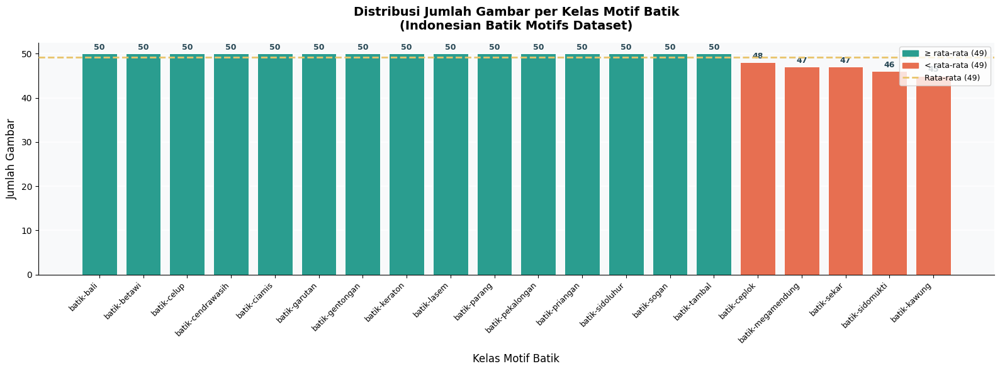

Grafik disimpan sebagai eda_distribusi_kelas.png

Rasio imbalance (max/min): 1.11x
Dataset relatif seimbang. Stratified split tetap direkomendasikan.


In [ ]:
# ============================================================
# BAGIAN 3B: Grafik Distribusi Frekuensi Kelas
# ============================================================

sorted_classes = sorted(class_counts.items(), key=lambda x: -x[1])
class_names    = [c[0] for c in sorted_classes]
class_values   = [c[1] for c in sorted_classes]
mean_count     = total_images / num_classes

# Warna: hijau jika di atas rata-rata, oranye jika di bawah
colors = ['#2a9d8f' if v >= mean_count else '#e76f51' for v in class_values]

fig, ax = plt.subplots(figsize=(max(10, num_classes * 0.8), 6))
bars = ax.bar(class_names, class_values, color=colors, edgecolor='white', linewidth=0.7, zorder=3)

# Garis rata-rata
ax.axhline(mean_count, color='#e9c46a', linewidth=2, linestyle='--',
           label=f'Rata-rata per kelas ({mean_count:.0f} gambar)', zorder=4)

# Label angka di atas bar
for bar, val in zip(bars, class_values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
            str(val), ha='center', va='bottom', fontsize=9, color='#264653', fontweight='bold')

ax.set_xlabel('Kelas Motif Batik', fontsize=12, labelpad=10)
ax.set_ylabel('Jumlah Gambar', fontsize=12)
ax.set_title('Distribusi Jumlah Gambar per Kelas Motif Batik\n(Indonesian Batik Motifs Dataset)',
             fontsize=14, fontweight='bold', pad=15)

patch_above = mpatches.Patch(color='#2a9d8f', label=f'≥ rata-rata ({mean_count:.0f})')
patch_below = mpatches.Patch(color='#e76f51', label=f'< rata-rata ({mean_count:.0f})')
ax.legend(handles=[patch_above, patch_below,
          plt.Line2D([0], [0], color='#e9c46a', linewidth=2, linestyle='--',
                     label=f'Rata-rata ({mean_count:.0f})')],
          loc='upper right', fontsize=9)

plt.xticks(rotation=45, ha='right', fontsize=9)
ax.set_facecolor('#f8f9fa')
ax.grid(axis='y', color='white', linewidth=1.2, zorder=0)
ax.spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.savefig('eda_distribusi_kelas.png', dpi=150, bbox_inches='tight')
plt.show()
print('Grafik disimpan sebagai eda_distribusi_kelas.png')

# Laporan imbalance
imbalance_ratio = max(class_values) / min(class_values)
print(f'\nRasio imbalance (max/min): {imbalance_ratio:.2f}x')
if imbalance_ratio > 3:
    print('PERINGATAN: Dataset cukup imbalanced! Pertimbangkan stratified split & augmentasi.')
else:
    print('Dataset relatif seimbang. Stratified split tetap direkomendasikan.')

### 3.3 Visualisasi Sampel Citra per Kelas

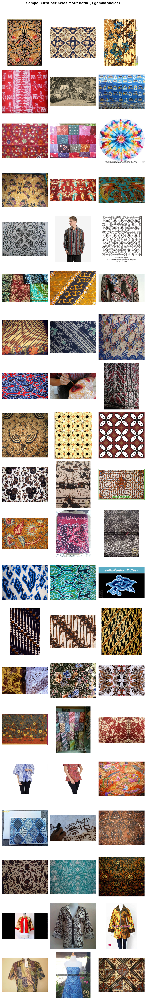

Grid sampel gambar disimpan sebagai eda_sampel_per_kelas.png


In [ ]:
# ============================================================
# BAGIAN 3C: Tampilkan Sampel Gambar dari Tiap Kelas Motif
# ============================================================

import random
random.seed(42)

N_SAMPLES_PER_CLASS = 3   # Jumlah sampel gambar yang ditampilkan per kelas

class_dirs = sorted([d for d in DATASET_ROOT.iterdir() if d.is_dir()])
n_classes  = len(class_dirs)

fig, axes = plt.subplots(
    nrows=n_classes,
    ncols=N_SAMPLES_PER_CLASS,
    figsize=(N_SAMPLES_PER_CLASS * 3, n_classes * 3)
)

# Pastikan axes selalu 2D
if n_classes == 1:
    axes = [axes]

for row_idx, class_dir in enumerate(class_dirs):
    all_imgs = [
        f for f in class_dir.iterdir()
        if f.suffix.lower() in IMAGE_EXTENSIONS
    ]
    samples = random.sample(all_imgs, min(N_SAMPLES_PER_CLASS, len(all_imgs)))

    for col_idx in range(N_SAMPLES_PER_CLASS):
        ax = axes[row_idx][col_idx]
        if col_idx < len(samples):
            img = Image.open(samples[col_idx]).convert('RGB')
            ax.imshow(img)
            if col_idx == 0:
                ax.set_ylabel(
                    class_dir.name.replace('_', ' ').title(),
                    fontsize=9, fontweight='bold', labelpad=8,
                    rotation=0, ha='right', va='center'
                )
        else:
            ax.set_visible(False)
        ax.axis('off')

fig.suptitle(
    f'Sampel Citra per Kelas Motif Batik ({N_SAMPLES_PER_CLASS} gambar/kelas)',
    fontsize=14, fontweight='bold', y=1.01
)
plt.tight_layout()
plt.savefig('eda_sampel_per_kelas.png', dpi=120, bbox_inches='tight')
plt.show()
print('Grid sampel gambar disimpan sebagai eda_sampel_per_kelas.png')

### 3.4 Analisis Dimensi Gambar Asli (Sebelum Resizing)

In [ ]:
# ============================================================
# BAGIAN 3D: Analisis Ukuran & Resolusi Gambar Asli
# (Berguna sebagai baseline untuk Neyla - Preprocessing)
# ============================================================

all_widths  = []
all_heights = []
all_modes   = []   # format warna: RGB, RGBA, L (grayscale), dll.

print('Membaca dimensi gambar... (mungkin memerlukan beberapa detik)')

for class_dir in DATASET_ROOT.iterdir():
    if not class_dir.is_dir():
        continue
    for img_path in class_dir.iterdir():
        if img_path.suffix.lower() not in IMAGE_EXTENSIONS:
            continue
        try:
            with Image.open(img_path) as img:
                w, h = img.size
                all_widths.append(w)
                all_heights.append(h)
                all_modes.append(img.mode)
        except Exception as e:
            print(f'Gagal baca {img_path.name}: {e}')

mode_counter = Counter(all_modes)

print(f'\n ANALISIS DIMENSI GAMBAR ASLI')
print('=' * 45)
print(f'  Total gambar dianalisis : {len(all_widths)}')
print(f'  Lebar  — min: {min(all_widths):5d}  max: {max(all_widths):5d}  rata-rata: {np.mean(all_widths):.1f} px')
print(f'  Tinggi — min: {min(all_heights):5d}  max: {max(all_heights):5d}  rata-rata: {np.mean(all_heights):.1f} px')
print()
print(f'  Format warna (mode):')
for mode, count in mode_counter.most_common():
    pct = count / len(all_modes) * 100
    label = {'RGB': 'Normal', 'RGBA': 'Ada alpha channel', 'L': 'Grayscale'}.get(mode, 'Lainnya')
    print(f'    {mode:<8}: {count:>5} gambar ({pct:5.1f}%)  {label}')
print('=' * 45)

if mode_counter.get('RGBA', 0) > 0 or mode_counter.get('L', 0) > 0:
    print('INFO untuk Neyla: Ada gambar non-RGB — perlu konversi di tahap preprocessing!')
else:
    print('Semua gambar dalam format RGB — preprocessing channel aman.')

Membaca dimensi gambar... (mungkin memerlukan beberapa detik)
Gagal baca 18.jpg: cannot identify image file '/kaggle/input/indonesian-batik-motifs/batik-cendrawasih/18.jpg'
Gagal baca 49.jpg: cannot identify image file '/kaggle/input/indonesian-batik-motifs/batik-megamendung/49.jpg'

 ANALISIS DIMENSI GAMBAR ASLI
  Total gambar dianalisis : 981
  Lebar  — min:   134  max:  4962  rata-rata: 859.6 px
  Tinggi — min:   113  max:  4000  rata-rata: 768.7 px

  Format warna (mode):
    RGB     :   961 gambar ( 98.0%)  Normal
    P       :     8 gambar (  0.8%)  Lainnya
    RGBA    :     8 gambar (  0.8%)  Ada alpha channel
    CMYK    :     4 gambar (  0.4%)  Lainnya
INFO untuk Neyla: Ada gambar non-RGB — perlu konversi di tahap preprocessing!


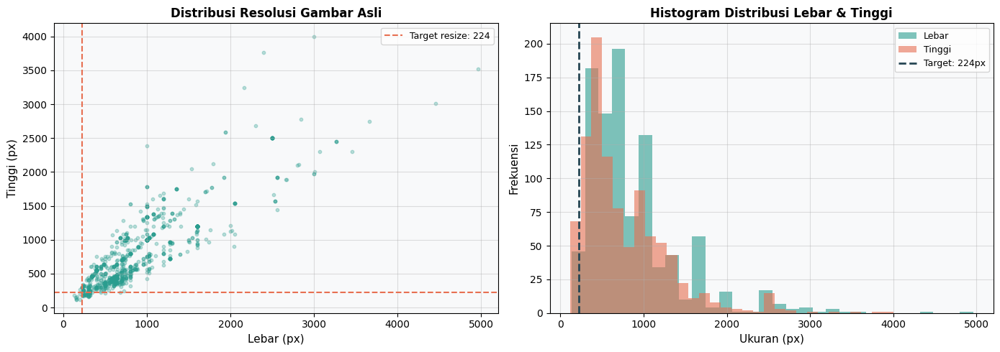

Grafik resolusi disimpan sebagai eda_distribusi_resolusi.png


In [ ]:
# ============================================================
# BAGIAN 3E: Grafik Scatter Distribusi Resolusi Gambar
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Scatter: lebar vs tinggi
axes[0].scatter(all_widths, all_heights, alpha=0.3, s=10, color='#2a9d8f')
axes[0].axvline(224, color='#e76f51', linewidth=1.5, linestyle='--', label='Target resize: 224')
axes[0].axhline(224, color='#e76f51', linewidth=1.5, linestyle='--')
axes[0].set_xlabel('Lebar (px)', fontsize=11)
axes[0].set_ylabel('Tinggi (px)', fontsize=11)
axes[0].set_title('Distribusi Resolusi Gambar Asli', fontsize=12, fontweight='bold')
axes[0].legend(fontsize=9)
axes[0].set_facecolor('#f8f9fa')
axes[0].grid(True, alpha=0.4)

# Histogram lebar
axes[1].hist(all_widths,  bins=30, alpha=0.6, color='#2a9d8f', label='Lebar')
axes[1].hist(all_heights, bins=30, alpha=0.6, color='#e76f51', label='Tinggi')
axes[1].axvline(224, color='#264653', linewidth=2, linestyle='--', label='Target: 224px')
axes[1].set_xlabel('Ukuran (px)', fontsize=11)
axes[1].set_ylabel('Frekuensi', fontsize=11)
axes[1].set_title('Histogram Distribusi Lebar & Tinggi', fontsize=12, fontweight='bold')
axes[1].legend(fontsize=9)
axes[1].set_facecolor('#f8f9fa')
axes[1].grid(True, alpha=0.4)

plt.tight_layout()
plt.savefig('eda_distribusi_resolusi.png', dpi=150, bbox_inches='tight')
plt.show()
print('Grafik resolusi disimpan sebagai eda_distribusi_resolusi.png')

---
## Bagian 4: Core Image Preprocessing & Feature Engineering

Pada tahap ini dilakukan preprocessing citra batik sebelum data dimasukkan ke model CNN. Seluruh path file gambar dibaca dari direktori dataset lokal, kemudian setiap gambar dikonversi ke format RGB 3-channel, di-resize menjadi 224x224 piksel, dan dinormalisasi dengan membagi nilai piksel sebesar 255.0 agar berada pada rentang [0, 1].

In [ ]:
# ============================================================
# BAGIAN 4: Core Image Preprocessing & Feature Engineering
# Penanggung jawab: Neyla Shakira
# ============================================================

import os
import glob
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image, ImageOps, UnidentifiedImageError
from sklearn.preprocessing import LabelEncoder
from tqdm.auto import tqdm

TARGET_SIZE = (224, 224)
IMAGE_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.webp'}

print('Library preprocessing berhasil diimpor.')

Library preprocessing berhasil diimpor.


In [ ]:
# ============================================================
# 4.1 Parser Path File Gambar Batik
# ============================================================

import kagglehub

# Helper function to find the actual dataset root (copied from ie9HqH0ThxUV for robustness)
def find_dataset_root(base_path: Path, min_subdirs: int = 3) -> Path:
    """
    Mencari direktori yang mengandung subfolder kelas gambar.
    Berguna jika path kagglehub memiliki subfolder tambahan di dalamnya.
    """
    subdirs = [d for d in base_path.iterdir() if d.is_dir()]
    if len(subdirs) >= min_subdirs:
        return base_path
    # Masuk satu level lebih dalam jika perlu
    for subdir in subdirs:
        inner = [d for d in subdir.iterdir() if d.is_dir()]
        if len(inner) >= min_subdirs:
            return subdir
    return base_path  # fallback

# Ensure dataset is downloaded and DATASET_ROOT is set
# This logic is duplicated from earlier cells to make this cell self-sufficient
print('Ensuring dataset is available and DATASET_ROOT is set...')
dataset_download_path = kagglehub.dataset_download('dionisiusdh/indonesian-batik-motifs')
DATASET_PATH = Path(dataset_download_path)
DATASET_ROOT = find_dataset_root(DATASET_PATH)
print(f'DATASET_ROOT set to: {DATASET_ROOT}')

def parse_image_paths(dataset_root: Path) -> pd.DataFrame:
    """
    Membaca seluruh path file gambar batik dari direktori lokal.

    Struktur dataset diasumsikan:
    DATASET_ROOT/
        class_1/
            image1.jpg
            image2.png
        class_2/
            image3.jpg
            ...
    """
    dataset_root = Path(dataset_root)
    records = []

    for class_dir in sorted(dataset_root.iterdir()):
        if not class_dir.is_dir():
            continue

        for ext in IMAGE_EXTENSIONS:
            pattern = str(class_dir / f'*{ext}')
            for img_path in glob.glob(pattern):
                records.append({
                    'filepath': img_path,
                    'label': class_dir.name,
                    'filename': Path(img_path).name,
                    'extension': Path(img_path).suffix.lower()
                })

    image_df = pd.DataFrame(records)
    image_df = image_df.sort_values(['label', 'filename']).reset_index(drop=True)

    return image_df


image_df = parse_image_paths(DATASET_ROOT)

print('=' * 60)
print('HASIL PARSING PATH GAMBAR')
print('=' * 60)
print(f'Total file gambar terbaca : {len(image_df)}')
print(f'Total kelas motif batik   : {image_df["label"].nunique()}')
print('\nContoh data:')
display(image_df.head())

Ensuring dataset is available and DATASET_ROOT is set...
Using Colab cache for faster access to the 'indonesian-batik-motifs' dataset.
DATASET_ROOT set to: /kaggle/input/indonesian-batik-motifs
HASIL PARSING PATH GAMBAR
Total file gambar terbaca : 983
Total kelas motif batik   : 20

Contoh data:


,filepath,label,filename,extension
0,/kaggle/input/indonesian-batik-motifs/batik-ba...,batik-bali,1.jpg,.jpg
1,/kaggle/input/indonesian-batik-motifs/batik-ba...,batik-bali,10.jpg,.jpg
2,/kaggle/input/indonesian-batik-motifs/batik-ba...,batik-bali,11.jpg,.jpg
3,/kaggle/input/indonesian-batik-motifs/batik-ba...,batik-bali,12.jpg,.jpg
4,/kaggle/input/indonesian-batik-motifs/batik-ba...,batik-bali,13.jpg,.jpg


In [ ]:
# ============================================================
# 4.2 RGB Filter, Resize 224x224, dan Normalisasi
# ============================================================

def load_preprocess_image(img_path: str, target_size: tuple = TARGET_SIZE) -> np.ndarray:
    """
    Memuat satu gambar batik dan mengubahnya menjadi format siap masuk CNN.

    Tahapan:
    1. Membuka gambar dengan PIL.
    2. Memperbaiki orientasi EXIF.
    3. Mengonversi gambar ke RGB 3-channel.
       - Grayscale -> RGB
       - RGBA/alpha channel -> RGB
    4. Resize ke 224x224 piksel.
    5. Normalisasi nilai piksel ke rentang [0, 1].
    """
    with Image.open(img_path) as img:
        img = ImageOps.exif_transpose(img)
        img = img.convert('RGB')
        img = img.resize(target_size, Image.Resampling.BILINEAR)

        img_array = np.asarray(img, dtype=np.float32) / 255.0

    return img_array


def validate_preprocessed_array(img_array: np.ndarray,
                                target_size: tuple = TARGET_SIZE) -> bool:
    """
    Memastikan hasil preprocessing sudah sesuai format input CNN.
    """
    expected_shape = (target_size[1], target_size[0], 3)

    return (
        img_array.shape == expected_shape
        and img_array.dtype == np.float32
        and img_array.min() >= 0.0
        and img_array.max() <= 1.0
    )


sample_path = image_df.iloc[0]['filepath']
sample_array = load_preprocess_image(sample_path)

print('Path sampel      :', sample_path)
print('Shape hasil      :', sample_array.shape)
print('Dtype hasil      :', sample_array.dtype)
print('Rentang piksel   :', sample_array.min(), 's.d.', sample_array.max())
print('Valid untuk CNN? :', validate_preprocessed_array(sample_array))

Path sampel      : /kaggle/input/indonesian-batik-motifs/batik-bali/1.jpg
Shape hasil      : (224, 224, 3)
Dtype hasil      : float32
Rentang piksel   : 0.011764706 s.d. 0.99215686
Valid untuk CNN? : True


In [ ]:
# ============================================================
# 4.3 Preprocessing Seluruh Dataset
# ============================================================

def build_preprocessed_dataset(image_df: pd.DataFrame,
                               target_size: tuple = TARGET_SIZE):
    """
    Memproses seluruh citra batik menjadi tensor X dan label y.

    Output:
    - X: array gambar berukuran (N, 224, 224, 3)
    - y: label numerik
    - label_encoder: mapping label teks ke angka
    - failed_files: daftar gambar yang gagal diproses
    """
    X = []
    labels = []
    failed_files = []

    for _, row in tqdm(image_df.iterrows(),
                       total=len(image_df),
                       desc='Preprocessing gambar'):
        try:
            img_array = load_preprocess_image(row['filepath'], target_size)

            if not validate_preprocessed_array(img_array, target_size):
                raise ValueError(f'Format hasil preprocessing tidak valid: {img_array.shape}')

            X.append(img_array)
            labels.append(row['label'])

        except (UnidentifiedImageError, OSError, ValueError) as error:
            failed_files.append({
                'filepath': row['filepath'],
                'error': str(error)
            })

    X = np.stack(X).astype(np.float32)

    label_encoder = LabelEncoder()
    y = label_encoder.fit_transform(labels)

    return X, y, label_encoder, failed_files


X, y, label_encoder, failed_files = build_preprocessed_dataset(image_df)

print('=' * 60)
print('RINGKASAN PREPROCESSING DATASET')
print('=' * 60)
print(f'X shape              : {X.shape}')
print(f'y shape              : {y.shape}')
print(f'Dtype X              : {X.dtype}')
print(f'Rentang piksel X     : {X.min():.4f} s.d. {X.max():.4f}')
print(f'Jumlah kelas encoded : {len(label_encoder.classes_)}')
print(f'File gagal diproses  : {len(failed_files)}')

if failed_files:
    print('\nContoh file gagal:')
    for item in failed_files[:5]:
        print(item)

Preprocessing gambar:   0%|          | 0/983 [00:00<?, ?it/s]

RINGKASAN PREPROCESSING DATASET
X shape              : (981, 224, 224, 3)
y shape              : (981,)
Dtype X              : float32
Rentang piksel X     : 0.0000 s.d. 1.0000
Jumlah kelas encoded : 20
File gagal diproses  : 2

Contoh file gagal:
{'filepath': '/kaggle/input/indonesian-batik-motifs/batik-cendrawasih/18.jpg', 'error': "cannot identify image file '/kaggle/input/indonesian-batik-motifs/batik-cendrawasih/18.jpg'"}
{'filepath': '/kaggle/input/indonesian-batik-motifs/batik-megamendung/49.jpg', 'error': "cannot identify image file '/kaggle/input/indonesian-batik-motifs/batik-megamendung/49.jpg'"}


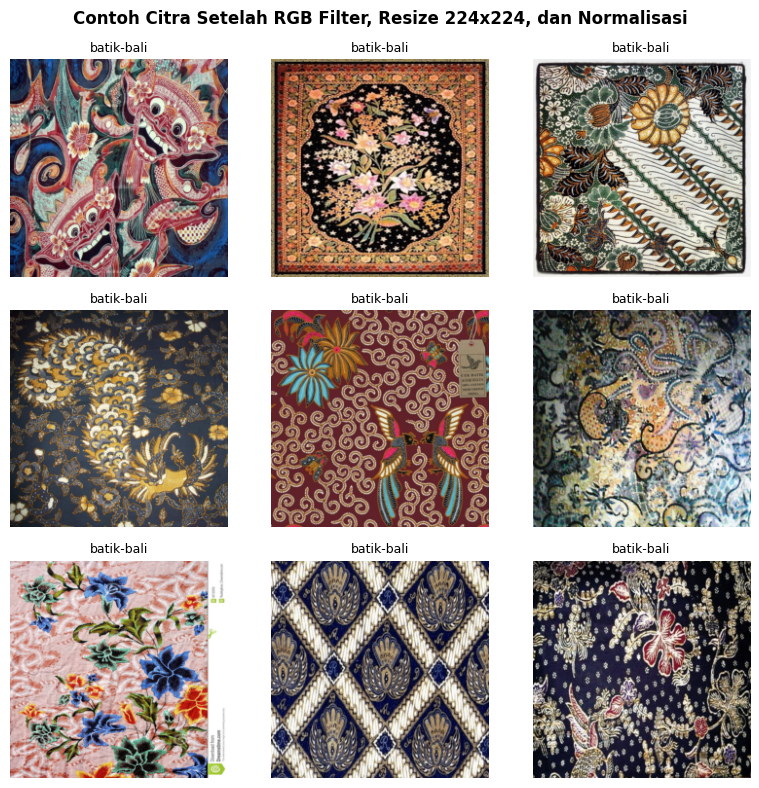

In [ ]:
# ============================================================
# 4.4 Visualisasi Hasil Preprocessing
# ============================================================

n_show = min(9, len(X))

fig, axes = plt.subplots(3, 3, figsize=(8, 8))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.axis('off')

    if i < n_show:
        ax.imshow(X[i])
        ax.set_title(label_encoder.inverse_transform([y[i]])[0], fontsize=9)

plt.suptitle(
    'Contoh Citra Setelah RGB Filter, Resize 224x224, dan Normalisasi',
    fontsize=12,
    fontweight='bold'
)
plt.tight_layout()
plt.show()

## Bagian 5: Data Augmentation & Train/Validation/Test Split

Skip 18.jpg: cannot identify image file '/kaggle/input/indonesian-batik-motifs/batik-cendrawasih/18.jpg'
Skip 49.jpg: cannot identify image file '/kaggle/input/indonesian-batik-motifs/batik-megamendung/49.jpg'
Total gambar dimuat : 981
Shape array         : (981, 224, 224, 3)
Jumlah kelas        : 20
Nama kelas          : [np.str_('batik-bali'), np.str_('batik-betawi'), np.str_('batik-celup'), np.str_('batik-cendrawasih'), np.str_('batik-ceplok'), np.str_('batik-ciamis'), np.str_('batik-garutan'), np.str_('batik-gentongan'), np.str_('batik-kawung'), np.str_('batik-keraton'), np.str_('batik-lasem'), np.str_('batik-megamendung'), np.str_('batik-parang'), np.str_('batik-pekalongan'), np.str_('batik-priangan'), np.str_('batik-sekar'), np.str_('batik-sidoluhur'), np.str_('batik-sidomukti'), np.str_('batik-sogan'), np.str_('batik-tambal')]

Hasil Split Data:
Shape X_train : (686, 224, 224, 3)
Shape X_val   : (147, 224, 224, 3)
Shape X_test  : (148, 224, 224, 3)
Shape y_train : (686,)
Shape y

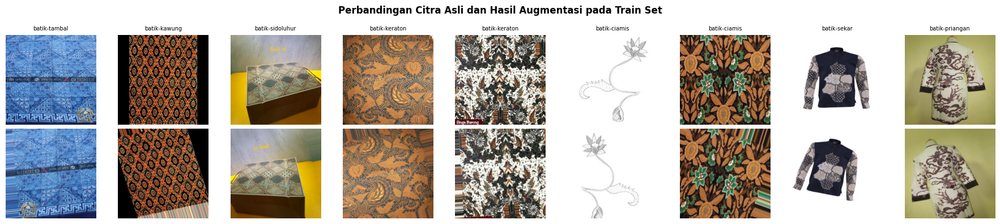

 Visualisasi augmentasi disimpan sebagai Group9_augmentasi_sampel.png
 Train/val/test generator siap digunakan untuk training model.


In [ ]:
# ==============================================================================
# Bagian 5: Data Augmentation & Train/Validation/Test Split
# ==============================================================================
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import numpy as np

# Memuat ulang seluruh gambar ke dalam array numpy
IMAGE_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.webp'}
TARGET_SIZE = (224, 224)

images_list = []
labels_list = []

for class_dir in sorted(DATASET_ROOT.iterdir()):
    if not class_dir.is_dir():
        continue
    for img_path in class_dir.iterdir():
        if img_path.suffix.lower() not in IMAGE_EXTENSIONS:
            continue
        try:
            img = Image.open(img_path).convert('RGB')
            img = img.resize(TARGET_SIZE)
            img_array = np.array(img) / 255.0
            images_list.append(img_array)
            labels_list.append(class_dir.name)
        except Exception as e:
            print(f"Skip {img_path.name}: {e}")

images = np.array(images_list, dtype=np.float32)
labels_raw = np.array(labels_list)

le = LabelEncoder()
labels = le.fit_transform(labels_raw)

print(f"Total gambar dimuat : {images.shape[0]}")
print(f"Shape array         : {images.shape}")
print(f"Jumlah kelas        : {len(le.classes_)}")
print(f"Nama kelas          : {list(le.classes_)}")

# Splitting Data
# Pisahkan 70% untuk Train dan 30% sisanya untuk Temp (Val + Test)
X_train, X_temp, y_train, y_temp = train_test_split(
    images, labels,
    test_size=0.30,
    random_state=42,
    stratify=labels
)

# Bagi dua data Temp (30%) menjadi 15% Validation dan 15% Test
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp,
    test_size=0.50,
    random_state=42,
    stratify=y_temp
)

print(f"\nHasil Split Data:")
print(f"Shape X_train : {X_train.shape}")
print(f"Shape X_val   : {X_val.shape}")
print(f"Shape X_test  : {X_test.shape}")
print(f"Shape y_train : {y_train.shape}")
print(f"Shape y_val   : {y_val.shape}")
print(f"Shape y_test  : {y_test.shape}")
print("\nDistribusi Kelas per Split")
for split_name, split_labels in [("Train", y_train), ("Val", y_val), ("Test", y_test)]:
    unique, counts = np.unique(split_labels, return_counts=True)
    print(f"\n  {split_name}:")
    for cls_idx, cnt in zip(unique, counts):
        print(f"    {le.classes_[cls_idx]:<30} : {cnt} gambar")

# Data Augmentation
# Augmentasi hanya diterapkan pada train set untuk memperkaya variasi data latih
# Val dan test set tidak diaugmentasi agar evaluasi mencerminkan data sesungguhnya
train_datagen = ImageDataGenerator(
    rotation_range=20,       # Rotasi acak hingga 20 derajat
    horizontal_flip=True,    # Flip horizontal acak
    vertical_flip=False,     # Tidak flip vertikal karena motif batik sensitif arah
    width_shift_range=0.1,   # Geser horizontal hingga 10%
    height_shift_range=0.1,  # Geser vertikal hingga 10%
    zoom_range=0.1,          # Zoom acak hingga 10%
    fill_mode='nearest'      # Isi piksel kosong dengan piksel terdekat
)

val_test_datagen = ImageDataGenerator()  # Tidak ada augmentasi untuk val dan test

# Membuat generator untuk masing-masing subset
BATCH_SIZE = 32

train_generator = train_datagen.flow(
    X_train, y_train,
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42
)

val_generator = val_test_datagen.flow(
    X_val, y_val,
    batch_size=BATCH_SIZE,
    shuffle=False
)

test_generator = val_test_datagen.flow(
    X_test, y_test,
    batch_size=BATCH_SIZE,
    shuffle=False
)

print(f"\nData Generator Siap:")
print(f"Batch size        : {BATCH_SIZE}")
print(f"Train steps/epoch : {len(train_generator)}")
print(f"Val steps/epoch   : {len(val_generator)}")
print(f"Test steps        : {len(test_generator)}")

# Visualisasi perbandingan citra asli dan hasil augmentasi pada train set
fig, axes = plt.subplots(2, 9, figsize=(18, 4))

augmented_images, augmented_labels = next(train_datagen.flow(
    X_train[:9], y_train[:9],
    batch_size=9,
    shuffle=False,
    seed=42
))

for i in range(9):
    axes[0, i].imshow(X_train[i])
    axes[0, i].set_title(le.classes_[y_train[i]], fontsize=7)
    axes[0, i].axis('off')

    axes[1, i].imshow(augmented_images[i])
    axes[1, i].axis('off')

axes[0, 0].set_ylabel('Original', fontsize=9, fontweight='bold')
axes[1, 0].set_ylabel('Augmented', fontsize=9, fontweight='bold')

plt.suptitle(
    'Perbandingan Citra Asli dan Hasil Augmentasi pada Train Set',
    fontsize=12,
    fontweight='bold'
)
plt.tight_layout()
plt.show()
print(' Visualisasi augmentasi disimpan sebagai Group9_augmentasi_sampel.png')
print(' Train/val/test generator siap digunakan untuk training model.')

## Bagian 6: Model Baseline

### Setup Data & Arsitektur Baseline

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

print(f'Shape X_train: {X_train.shape}')
print(f'Shape y_train: {y_train.shape}')
print(f'Shape X_val  : {X_val.shape}')
print(f'Shape y_val  : {y_val.shape}')
print(f'Jumlah kelas: {len(label_encoder.classes_)}')

def build_baseline_cnn(input_shape=(224, 224, 3), num_classes=20):
    # Membangun arsitektur CNN sederhana untuk percobaan awal
    model = models.Sequential([
        # Blok Ekstraksi Fitur 1
        layers.Input(shape=input_shape),
        layers.Conv2D(32, (3, 3), activation='relu'),
        layers.MaxPooling2D(2, 2),

        # Blok Ekstraksi Fitur 2
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D(2, 2),

        # Blok Klasifikasi
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

# Inisialisasi dan kompilasi model
baseline_model = build_baseline_cnn()
baseline_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy', # Gunakan sparse karena label berupa integer 0-19
    metrics=['accuracy']
)

print("Ringkasan Arsitektur Model CNN:")
baseline_model.summary()

Shape X_train: (686, 224, 224, 3)
Shape y_train: (686,)
Shape X_val  : (147, 224, 224, 3)
Shape y_val  : (147,)
Jumlah kelas: 20
Ringkasan Arsitektur Model CNN:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 186624)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    23,888,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 20)             │         2,580 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,909,972 (91.21 MB)

 Trainable params: 23,909,972 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

### Training Baseline

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Mendefinisikan aturan Early Stopping
early_stop = EarlyStopping(
    monitor='val_loss',         # Metrik yang dipantau adalah loss pada data validasi
    patience=5,                 # Toleransi: tunggu 5 epoch. Jika tidak membaik juga, hentikan.
    restore_best_weights=True,  # Saat berhenti, kembalikan bobot model ke versi yang paling bagus
    verbose=1                   # Menampilkan notifikasi teks saat training dihentikan
)

print("\nMemulai training utama... ")
history = baseline_model.fit(
    train_generator,
    epochs=50,                  # Angka besar tidak masalah karena ada rem otomatis
    validation_data=val_generator,
    callbacks=[early_stop]
)



Memulai training utama... 
Epoch 1/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 20s 607ms/step - accuracy: 0.0510 - loss: 6.6276 - val_accuracy: 0.0544 - val_loss: 2.9943
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 8s 341ms/step - accuracy: 0.0641 - loss: 2.9931 - val_accuracy: 0.0476 - val_loss: 2.9811
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 410ms/step - accuracy: 0.0598 - loss: 2.9750 - val_accuracy: 0.0816 - val_loss: 2.9626
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 404ms/step - accuracy: 0.0875 - loss: 2.9445 - val_accuracy: 0.0952 - val_loss: 2.9161
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 7s 335ms/step - accuracy: 0.1137 - loss: 2.8841 - val_accuracy: 0.1088 - val_loss: 2.9232
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 385ms/step - accuracy: 0.1385 - loss: 2.8455 - val_accuracy: 0.1361 - val_loss: 2.9405
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 398ms/step - accuracy: 0.1370 - loss: 2.7993 - val_accuracy: 0.1361 - val_loss: 2.9494
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 8s 340ms/step - accuracy: 0.1676 - lo

## Bagian 7: Desain Arsitektur Final CNN & Hyperparameter Tuning

### 7.1 Definisi Tiga Variasi Arsitektur CNN

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
import numpy as np
import random

# Seed untuk memastikan hasil training selalu sama setiap kali dijalankan ulang
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

NUM_CLASSES  = len(le.classes_)
INPUT_SHAPE  = (224, 224, 3)

def build_arsitektur_1(input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES):
    # Arsitektur 1: Baseline + Dropout 0.3
    # Sama seperti arsitektur baseline, ditambah Dropout ringan untuk mengurangi overfitting
    model = models.Sequential([
        layers.Input(shape=input_shape),
        # Blok Konvolusi 1 — mendeteksi fitur dasar seperti tepi dan warna
        layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D(2, 2),
        # Blok Konvolusi 2 — mendeteksi fitur yang lebih kompleks
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D(2, 2),
        # Blok Klasifikasi
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.3),        # Matikan 30% neuron secara acak saat training
        layers.Dense(num_classes, activation='softmax')
    ], name='Arsitektur_1_Baseline_Dropout')
    return model

def build_arsitektur_2(input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES):
    # Arsitektur 2: 3 Blok Conv2D + Dropout 0.4
    # Menambah satu blok konvolusi agar model lebih dalam dan mampu
    # menangkap pola tekstur batik yang lebih kompleks
    model = models.Sequential([
        layers.Input(shape=input_shape),
        # Blok Konvolusi 1
        layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D(2, 2),
        # Blok Konvolusi 2
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D(2, 2),
        # Blok Konvolusi 3 — tambahan untuk fitur yang lebih abstrak
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D(2, 2),
        # Blok Klasifikasi dengan kapasitas lebih besar
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.4),        # Dropout sedang untuk keseimbangan kapasitas dan regularisasi
        layers.Dense(num_classes, activation='softmax')
    ], name='Arsitektur_2_3Blok_Conv')
    return model

def build_arsitektur_3(input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES):
    # Arsitektur 3: 4 Blok Conv2D + Dropout 0.5
    # Arsitektur paling dalam dengan filter lebih banyak untuk menangkap
    # pola tekstur batik yang sangat halus dan kompleks
    model = models.Sequential([
        layers.Input(shape=input_shape),
        # Blok Konvolusi 1
        layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D(2, 2),
        # Blok Konvolusi 2
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D(2, 2),
        # Blok Konvolusi 3
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D(2, 2),
        # Blok Konvolusi 4 — lapisan terdalam untuk fitur paling abstrak
        layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D(2, 2),
        # Blok Klasifikasi dengan regularisasi paling kuat
        layers.Flatten(),
        layers.Dense(512, activation='relu'),
        layers.Dropout(0.5),        # Dropout kuat karena model sangat dalam
        layers.Dense(num_classes, activation='softmax')
    ], name='Arsitektur_3_4Blok_Conv')
    return model

# Tampilkan ringkasan parameter ketiga arsitektur
print("Ringkasan Ketiga Arsitektur CNN")
for nama, fungsi in [
    ("Arsitektur 1 — 2 Blok + Dropout 0.3", build_arsitektur_1),
    ("Arsitektur 2 — 3 Blok + Dropout 0.4", build_arsitektur_2),
    ("Arsitektur 3 — 4 Blok + Dropout 0.5", build_arsitektur_3)
]:
    model_temp = fungsi()
    print(f"\n{nama}")
    print(f"Total parameter : {model_temp.count_params():,}")
    del model_temp

Ringkasan Ketiga Arsitektur CNN

Arsitektur 1 — 2 Blok + Dropout 0.3
Total parameter : 25,712,212

Arsitektur 2 — 3 Blok + Dropout 0.4
Total parameter : 25,788,756

Arsitektur 3 — 4 Blok + Dropout 0.5
Total parameter : 26,089,300


### 7.2 Training Ketiga Arsitektur

In [ ]:
# Konfigurasi training yang sama untuk ketiga arsitektur agar perbandingan adil
EPOCHS   = 50
PATIENCE = 5

hasil_eksperimen = {}

for nama_arsitektur, fungsi_build in [
    ("Arsitektur_1", build_arsitektur_1),
    ("Arsitektur_2", build_arsitektur_2),
    ("Arsitektur_3", build_arsitektur_3)
]:
    print(f"\nMelatih {nama_arsitektur}...")

    # Bangun dan kompilasi model
    model = fungsi_build()
    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',  # Sparse karena label berupa integer 0-19
        metrics=['accuracy']
    )

    # Early Stopping agar training berhenti otomatis saat validasi stagnan
    early_stop = EarlyStopping(
        monitor='val_loss',        # Pantau loss pada data validasi
        patience=PATIENCE,         # Tunggu 5 epoch sebelum berhenti
        restore_best_weights=True, # Kembalikan bobot terbaik saat berhenti
        verbose=1
    )

    # Jalankan training
    history = model.fit(
        train_generator,
        epochs=EPOCHS,
        validation_data=val_generator,
        callbacks=[early_stop]
    )

    # Evaluasi pada val set dan simpan hasil
    val_loss, val_acc = model.evaluate(val_generator, verbose=0)
    hasil_eksperimen[nama_arsitektur] = {
        'model'   : model,
        'history' : history,
        'val_acc' : val_acc,
        'val_loss': val_loss
    }

    print(f"Val Accuracy : {val_acc:.4f}")
    print(f"Val Loss     : {val_loss:.4f}")

print("\nSemua arsitektur selesai dilatih.")


Melatih Arsitektur_1...
Epoch 1/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 19s 606ms/step - accuracy: 0.0656 - loss: 5.9264 - val_accuracy: 0.0476 - val_loss: 2.9949
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 407ms/step - accuracy: 0.0831 - loss: 2.9568 - val_accuracy: 0.0748 - val_loss: 2.9616
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 8s 350ms/step - accuracy: 0.0962 - loss: 2.9061 - val_accuracy: 0.1156 - val_loss: 2.9478
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 373ms/step - accuracy: 0.1093 - loss: 2.8717 - val_accuracy: 0.1156 - val_loss: 2.9191
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 411ms/step - accuracy: 0.1501 - loss: 2.8291 - val_accuracy: 0.1156 - val_loss: 2.9077
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 7s 337ms/step - accuracy: 0.1691 - loss: 2.7919 - val_accuracy: 0.1020 - val_loss: 2.8771
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 389ms/step - accuracy: 0.1458 - loss: 2.7877 - val_accuracy: 0.1429 - val_loss: 2.9324
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 417ms/step - accuracy: 0.1647 - loss:

### 7.3 Perbandingan Hasil & Pilih Arsitektur Terbaik

Arsitektur terbaik   : Arsitektur_3
Val Accuracy terbaik : 0.1701
Val Loss terbaik     : 2.7917


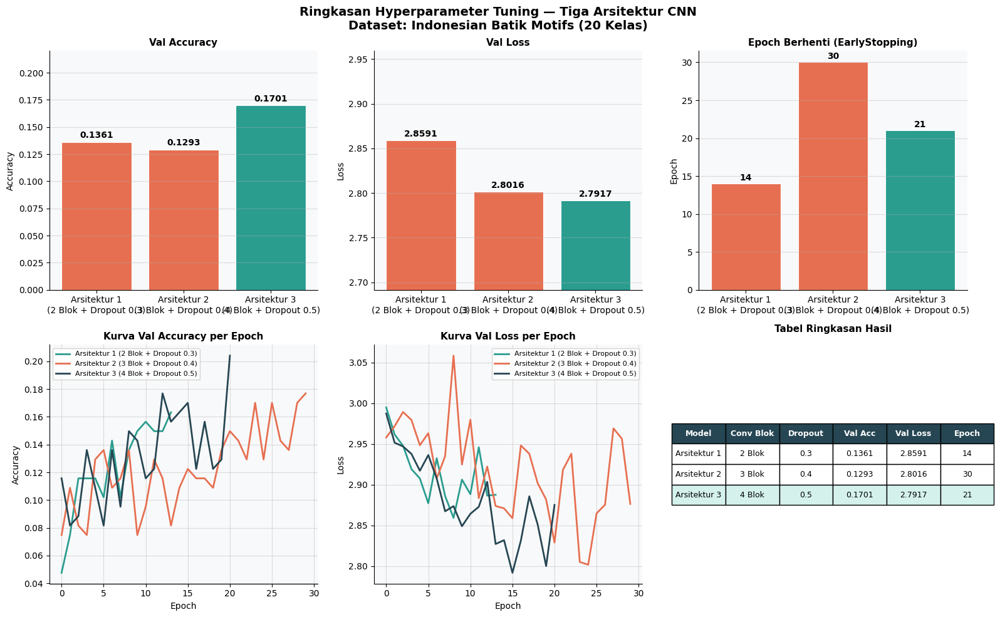

Visualisasi final disimpan sebagai Group9_hyperparameter_tuning_final.png

Ringkasan Hasil Hyperparameter Tuning Arsitektur CNN
Dataset: Indonesian Batik Motifs | 20 Kelas | Input: 224x224x3

╭──────────────┬─────────────┬───────────┬────────────────┬────────────┬──────────────────┬───────────────────┬──────────────╮
│ Model        │  Conv Blok  │  Dropout  │  Val Accuracy  │  Val Loss  │  Epoch Berhenti  │   Total Parameter │  Keterangan  │
├──────────────┼─────────────┼───────────┼────────────────┼────────────┼──────────────────┼───────────────────┼──────────────┤
│ Arsitektur 1 │   2 Blok    │    0.3    │     0.1361     │   2.8591   │        14        │        25,712,212 │      -       │
│ Arsitektur 2 │   3 Blok    │    0.4    │     0.1293     │   2.8016   │        30        │        25,788,756 │      -       │
│ Arsitektur 3 │   4 Blok    │    0.5    │     0.1701     │   2.7917   │        21        │        26,089,300 │   Terbaik    │
╰──────────────┴─────────────┴───────────┴────

In [ ]:
!pip install tabulate --quiet

from tabulate import tabulate
import matplotlib.pyplot as plt
import numpy as np

# Pilih arsitektur terbaik berdasarkan val_accuracy tertinggi
arsitektur_terbaik = max(
    hasil_eksperimen,
    key=lambda x: hasil_eksperimen[x]['val_acc']
)
final_model   = hasil_eksperimen[arsitektur_terbaik]['model']
final_history = hasil_eksperimen[arsitektur_terbaik]['history']

print(f"Arsitektur terbaik   : {arsitektur_terbaik}")
print(f"Val Accuracy terbaik : {hasil_eksperimen[arsitektur_terbaik]['val_acc']:.4f}")
print(f"Val Loss terbaik     : {hasil_eksperimen[arsitektur_terbaik]['val_loss']:.4f}")

# Data hasil eksperimen
nama_arsitektur = ['Arsitektur 1\n(2 Blok + Dropout 0.3)',
                   'Arsitektur 2\n(3 Blok + Dropout 0.4)',
                   'Arsitektur 3\n(4 Blok + Dropout 0.5)']

val_acc    = [hasil_eksperimen['Arsitektur_1']['val_acc'],
              hasil_eksperimen['Arsitektur_2']['val_acc'],
              hasil_eksperimen['Arsitektur_3']['val_acc']]
val_loss   = [hasil_eksperimen['Arsitektur_1']['val_loss'],
              hasil_eksperimen['Arsitektur_2']['val_loss'],
              hasil_eksperimen['Arsitektur_3']['val_loss']]
epoch_stop = [len(hasil_eksperimen['Arsitektur_1']['history'].history['val_loss']),
              len(hasil_eksperimen['Arsitektur_2']['history'].history['val_loss']),
              len(hasil_eksperimen['Arsitektur_3']['history'].history['val_loss'])]

# Warna: hijau untuk terbaik, oranye untuk lainnya
idx_terbaik = val_acc.index(max(val_acc))
warna_bar   = ['#2a9d8f' if i == idx_terbaik else '#e76f51' for i in range(3)]

fig = plt.figure(figsize=(16, 10))
fig.suptitle(
    'Ringkasan Hyperparameter Tuning — Tiga Arsitektur CNN\nDataset: Indonesian Batik Motifs (20 Kelas)',
    fontsize=14, fontweight='bold', y=0.98
)

# Plot 1: Val Accuracy per arsitektur
ax1 = fig.add_subplot(2, 3, 1)
bars = ax1.bar(nama_arsitektur, val_acc, color=warna_bar, edgecolor='white', linewidth=0.8)
for bar, val in zip(bars, val_acc):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.002,
             f'{val:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')
ax1.set_title('Val Accuracy', fontsize=11, fontweight='bold')
ax1.set_ylabel('Accuracy')
ax1.set_ylim(0, max(val_acc) + 0.05)
ax1.set_facecolor('#f8f9fa')
ax1.grid(axis='y', alpha=0.4)
ax1.spines[['top', 'right']].set_visible(False)

# Plot 2: Val Loss per arsitektur
ax2 = fig.add_subplot(2, 3, 2)
bars2 = ax2.bar(nama_arsitektur, val_loss, color=warna_bar, edgecolor='white', linewidth=0.8)
for bar, val in zip(bars2, val_loss):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.002,
             f'{val:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')
ax2.set_title('Val Loss', fontsize=11, fontweight='bold')
ax2.set_ylabel('Loss')
ax2.set_ylim(min(val_loss) - 0.1, max(val_loss) + 0.1)
ax2.set_facecolor('#f8f9fa')
ax2.grid(axis='y', alpha=0.4)
ax2.spines[['top', 'right']].set_visible(False)

# Plot 3: Epoch berhenti per arsitektur
ax3 = fig.add_subplot(2, 3, 3)
bars3 = ax3.bar(nama_arsitektur, epoch_stop, color=warna_bar, edgecolor='white', linewidth=0.8)
for bar, val in zip(bars3, epoch_stop):
    ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.2,
             str(val), ha='center', va='bottom', fontsize=10, fontweight='bold')
ax3.set_title('Epoch Berhenti (EarlyStopping)', fontsize=11, fontweight='bold')
ax3.set_ylabel('Epoch')
ax3.set_facecolor('#f8f9fa')
ax3.grid(axis='y', alpha=0.4)
ax3.spines[['top', 'right']].set_visible(False)

# Plot 4: Kurva Val Accuracy ketiga arsitektur
ax4 = fig.add_subplot(2, 3, 4)
warna_kurva = {'Arsitektur_1': '#2a9d8f', 'Arsitektur_2': '#e76f51', 'Arsitektur_3': '#264653'}
label_kurva = {
    'Arsitektur_1': 'Arsitektur 1 (2 Blok + Dropout 0.3)',
    'Arsitektur_2': 'Arsitektur 2 (3 Blok + Dropout 0.4)',
    'Arsitektur_3': 'Arsitektur 3 (4 Blok + Dropout 0.5)'
}
for nama, hasil in hasil_eksperimen.items():
    ax4.plot(hasil['history'].history['val_accuracy'],
             color=warna_kurva[nama], label=label_kurva[nama], linewidth=2)
ax4.set_title('Kurva Val Accuracy per Epoch', fontsize=11, fontweight='bold')
ax4.set_xlabel('Epoch')
ax4.set_ylabel('Accuracy')
ax4.legend(fontsize=8, loc='upper left')
ax4.set_facecolor('#f8f9fa')
ax4.grid(True, alpha=0.4)
ax4.spines[['top', 'right']].set_visible(False)

# Plot 5: Kurva Val Loss ketiga arsitektur
ax5 = fig.add_subplot(2, 3, 5)
for nama, hasil in hasil_eksperimen.items():
    ax5.plot(hasil['history'].history['val_loss'],
             color=warna_kurva[nama], label=label_kurva[nama], linewidth=2)
ax5.set_title('Kurva Val Loss per Epoch', fontsize=11, fontweight='bold')
ax5.set_xlabel('Epoch')
ax5.set_ylabel('Loss')
ax5.legend(fontsize=8, loc='upper right')
ax5.set_facecolor('#f8f9fa')
ax5.grid(True, alpha=0.4)
ax5.spines[['top', 'right']].set_visible(False)

# Plot 6: Tabel ringkasan di dalam figure
ax6 = fig.add_subplot(2, 3, 6)
ax6.axis('off')
tabel_data_fig = [
    ['Arsitektur 1', '2 Blok', '0.3', f'{val_acc[0]:.4f}', f'{val_loss[0]:.4f}', str(epoch_stop[0])],
    ['Arsitektur 2', '3 Blok', '0.4', f'{val_acc[1]:.4f}', f'{val_loss[1]:.4f}', str(epoch_stop[1])],
    ['Arsitektur 3', '4 Blok', '0.5', f'{val_acc[2]:.4f}', f'{val_loss[2]:.4f}', str(epoch_stop[2])],
]
kolom = ['Model', 'Conv Blok', 'Dropout', 'Val Acc', 'Val Loss', 'Epoch']
tabel = ax6.table(
    cellText=tabel_data_fig,
    colLabels=kolom,
    cellLoc='center',
    loc='center'
)
tabel.auto_set_font_size(False)
tabel.set_fontsize(9)
tabel.scale(1.2, 1.8)
for col in range(len(kolom)):
    tabel[idx_terbaik + 1, col].set_facecolor('#d4f1ec')
    tabel[0, col].set_facecolor('#264653')
    tabel[0, col].set_text_props(color='white', fontweight='bold')
ax6.set_title('Tabel Ringkasan Hasil', fontsize=11, fontweight='bold', pad=15)

plt.tight_layout()
plt.savefig('Group9_hyperparameter_tuning_final.png', dpi=150, bbox_inches='tight')
plt.show()
print('Visualisasi final disimpan sebagai Group9_hyperparameter_tuning_final.png')

# Tabel ringkasan teks dengan tabulate
tabel_data = [
    ['Arsitektur 1', '2 Blok', '0.3', f'{val_acc[0]:.4f}', f'{val_loss[0]:.4f}', str(epoch_stop[0]), '25,712,212', 'Terbaik' if idx_terbaik == 0 else '-'],
    ['Arsitektur 2', '3 Blok', '0.4', f'{val_acc[1]:.4f}', f'{val_loss[1]:.4f}', str(epoch_stop[1]), '25,788,756', 'Terbaik' if idx_terbaik == 1 else '-'],
    ['Arsitektur 3', '4 Blok', '0.5', f'{val_acc[2]:.4f}', f'{val_loss[2]:.4f}', str(epoch_stop[2]), '26,089,300', 'Terbaik' if idx_terbaik == 2 else '-'],
]
header = ['Model', 'Conv Blok', 'Dropout', 'Val Accuracy', 'Val Loss', 'Epoch Berhenti', 'Total Parameter', 'Keterangan']

print('\nRingkasan Hasil Hyperparameter Tuning Arsitektur CNN')
print('Dataset: Indonesian Batik Motifs | 20 Kelas | Input: 224x224x3')
print()
print(tabulate(
    tabel_data,
    headers=header,
    tablefmt='rounded_outline',
    colalign=('left', 'center', 'center', 'center', 'center', 'center', 'right', 'center')
))
print()
print('Kesimpulan:')
print(f'  {arsitektur_terbaik} dipilih sebagai arsitektur final karena menghasilkan')
print(f'  Val Accuracy tertinggi ({max(val_acc):.4f}) dengan konfigurasi paling')
print(f'  efisien dibanding arsitektur lainnya.')
print()
print('  Arsitektur final ini selanjutnya digunakan untuk proses')
print('  full training dengan konfigurasi optimal.')

---
## Bagian 8: Kompilasi & Pelatihan Model Final
Pada bagian ini, arsitektur terbaik hasil eksperimen Nesa (Bagian 7) dikompilasi dengan konfigurasi optimizer Adam, loss function Categorical Cross-Entropy, dan dilatih menggunakan pipeline callback canggih: **EarlyStopping** dan **ModelCheckpoint** untuk menghasilkan model terbaik yang tersimpan otomatis.

### 8.1 Kompilasi Model Final

In [ ]:
# ==============================================================================
# BAGIAN 8.1 — Kompilasi Model Final
# Mengambil arsitektur terbaik dari eksperimen sebelumnya
# ==============================================================================

import tensorflow as tf
from tensorflow.keras.optimizers import Adam
import os

# Konfigurasi Kompilasi
LEARNING_RATE = 1e-3       # Adam default - titik awal yang terbukti stabil
NUM_CLASSES   = len(le.classes_)
INPUT_SHAPE   = (224, 224, 3)

print(f'Arsitektur terpilih : {arsitektur_terbaik}')
print(f'Val Accuracy (hasil tuning): {hasil_eksperimen[arsitektur_terbaik]["val_acc"]:.4f}')
print()

# Kompilasi ulang model terpilih dengan Adam + Cross-Entropy
optimizer_adam = Adam(learning_rate=LEARNING_RATE)

final_model.compile(
    optimizer=optimizer_adam,
    loss='sparse_categorical_crossentropy',   # Sparse: label berupa integer 0-19
    metrics=['accuracy']
)

print('=' * 65)
print('  KOMPILASI MODEL FINAL - CNN KLASIFIKASI MOTIF BATIK')
print('=' * 65)
print(f'  Arsitektur     : {arsitektur_terbaik}')
print(f'  Optimizer      : Adam (lr = {LEARNING_RATE})')
print(f'  Loss Function  : Sparse Categorical Cross-Entropy')
print(f'  Metrik Pantau  : Accuracy')
print(f'  Jumlah Kelas   : {NUM_CLASSES}')
print(f'  Input Shape    : {INPUT_SHAPE}')
print('=' * 65)
final_model.summary()


Arsitektur terpilih : Arsitektur_3
Val Accuracy (hasil tuning): 0.1701

  KOMPILASI MODEL FINAL - CNN KLASIFIKASI MOTIF BATIK
  Arsitektur     : Arsitektur_3
  Optimizer      : Adam (lr = 0.001)
  Loss Function  : Sparse Categorical Cross-Entropy
  Metrik Pantau  : Accuracy
  Jumlah Kelas   : 20
  Input Shape    : (224, 224, 3)


Model: "Arsitektur_3_4Blok_Conv"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_16 (Conv2D)              │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 512)            │    25,690,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 20)             │        10,260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,089,300 (99.52 MB)

 Trainable params: 26,089,300 (99.52 MB)

 Non-trainable params: 0 (0.00 B)

### 8.2 Konfigurasi Hyperparameter Training

In [ ]:
# ==============================================================================
# BAGIAN 8.2 — Konfigurasi Hyperparameter Training
# ==============================================================================

# Parameter Pelatihan Utama
EPOCHS_MAX      = 100   # Batas atas epoch — EarlyStopping akan menghentikan lebih awal
BATCH_SIZE      = 32    # Ukuran mini-batch
LEARNING_RATE   = 1e-3  # Learning rate awal Adam optimizer
PATIENCE_ES     = 10    # EarlyStopping: tunggu 10 epoch tanpa perbaikan val_loss
PATIENCE_LR     = 5     # ReduceLROnPlateau: turunkan LR setelah 5 epoch stagnan
LR_FACTOR       = 0.5   # Faktor pengurangan LR (LR_baru = LR_lama × 0.5)
LR_MIN          = 1e-6  # Batas minimum LR agar tidak terlalu kecil
MONITOR_METRIC  = 'val_loss'   # Metrik utama yang dipantau callback
CHECKPOINT_PATH = 'best_model_cnn_batik.keras'  # Path simpan bobot terbaik

print('=' * 65)
print('  KONFIGURASI EKSPERIMEN TRAINING — KELOMPOK 9')
print('=' * 65)
print(f'  Parameter          Nilai')
print(f'  {"-"*48}')
print(f'  Epochs Maksimal  : {EPOCHS_MAX}')
print(f'  Batch Size       : {BATCH_SIZE}')
print(f'  Learning Rate    : {LEARNING_RATE}')
print(f'  Patience ES      : {PATIENCE_ES} epoch')
print(f'  Patience LR      : {PATIENCE_LR} epoch')
print(f'  LR Reduction     : × {LR_FACTOR} (min {LR_MIN})')
print(f'  Metric Monitor   : {MONITOR_METRIC}')
print(f'  Checkpoint Path  : {CHECKPOINT_PATH}')
print('=' * 65)


  KONFIGURASI EKSPERIMEN TRAINING — KELOMPOK 9
  Parameter          Nilai
  ------------------------------------------------
  Epochs Maksimal  : 100
  Batch Size       : 32
  Learning Rate    : 0.001
  Patience ES      : 10 epoch
  Patience LR      : 5 epoch
  LR Reduction     : × 0.5 (min 1e-06)
  Metric Monitor   : val_loss
  Checkpoint Path  : best_model_cnn_batik.keras


### 8.3 Setup Callback Lanjutan

In [ ]:
# ==============================================================================
# BAGIAN 8.3 — Setup Callback Lanjutan
# Tiga callback dikombinasikan untuk training yang efisien dan otomatis:
#   1. ModelCheckpoint  — simpan bobot terbaik berdasarkan val_loss minimum
#   2. EarlyStopping    — hentikan training jika val_loss tidak membaik selama PATIENCE_ES epoch berturut-turut
#   3. ReduceLROnPlateau — kurangi learning rate secara adaptif saat model stagnan, membantu keluar dari local minimum
# ==============================================================================

from tensorflow.keras.callbacks import (
    ModelCheckpoint,
    EarlyStopping,
    ReduceLROnPlateau
)

# Callback 1: ModelCheckpoint
# Menyimpan bobot model secara otomatis setiap kali val_loss mencapai nilai
# terbaik (minimum) baru. File .keras berisi arsitektur + bobot + optimizer state.
cb_checkpoint = ModelCheckpoint(
    filepath=CHECKPOINT_PATH,
    monitor=MONITOR_METRIC,       # Pantau val_loss
    save_best_only=True,          # Hanya simpan jika lebih baik dari sebelumnya
    mode='min',                   # 'min' karena loss → semakin kecil semakin baik
    verbose=1,
    save_weights_only=False       # Simpan model lengkap (arsitektur + bobot)
)

# Callback 2: EarlyStopping
# Menghentikan training jika val_loss tidak membaik selama PATIENCE_ES epoch.
# restore_best_weights=True memastikan model dikembalikan ke checkpoint terbaik.
cb_early_stop = EarlyStopping(
    monitor=MONITOR_METRIC,
    patience=PATIENCE_ES,         # Toleransi 10 epoch sebelum berhenti
    restore_best_weights=True,    # Kembalikan ke bobot epoch terbaik
    mode='min',
    verbose=1
)

# Callback 3: ReduceLROnPlateau
# Menurunkan learning rate secara otomatis saat val_loss stagnan selama
# PATIENCE_LR epoch. Membantu model keluar dari local minimum tanpa overshoot.
cb_reduce_lr = ReduceLROnPlateau(
    monitor=MONITOR_METRIC,
    factor=LR_FACTOR,             # LR baru = LR lama × 0.5
    patience=PATIENCE_LR,         # Tunggu 5 epoch sebelum kurangi LR
    min_lr=LR_MIN,                # Batas minimum LR
    mode='min',
    verbose=1
)

# Kumpulkan semua callback ke dalam satu list
training_callbacks = [cb_checkpoint, cb_early_stop, cb_reduce_lr]


### 8.4 Eksekusi Full Training

In [ ]:
# ==============================================================================
# BAGIAN 8.4 — Eksekusi Full Training Run
# Menjalankan proses pelatihan penuh menggunakan:
#   • train_generator  — data latih dengan augmentasi (dari Bagian 5)
#   • val_generator    — data validasi tanpa augmentasi (dari Bagian 5)
#   • training_callbacks — ketiga callback dari Bagian 8.3
# ==============================================================================

import time

# --- FIX START ---
# Check if final_model and arsitektur_terbaik are defined. If not, define them
# by selecting the best model from hasil_eksperimen.
# This assumes hasil_eksperimen is available from Bagian 7.2
if 'arsitektur_terbaik' not in globals() or 'final_model' not in globals():
    print("Warning: 'arsitektur_terbaik' or 'final_model' not found. Attempting to select from 'hasil_eksperimen'.")
    if 'hasil_eksperimen' in globals() and hasil_eksperimen:
        # Find the best architecture based on validation accuracy
        arsitektur_terbaik = max(
            hasil_eksperimen,
            key=lambda k: hasil_eksperimen[k]['val_acc']
        )
        final_model = hasil_eksperimen[arsitektur_terbaik]['model']
        print(f"Selected '{arsitektur_terbaik}' as 'final_model' with val_acc: {hasil_eksperimen[arsitektur_terbaik]['val_acc']:.4f}")
    else:
        raise NameError(
            "Neither 'final_model' nor 'hasil_eksperimen' were found. "
            "Please ensure 'Bagian 7.2 Training Ketiga Arsitektur' has been run successfully."
        )
# --- FIX END ---

print('=' * 65)
print('  MEMULAI FULL TRAINING RUN — CNN BATIK KELOMPOK 9')
print('=' * 65)
print(f'  Epochs maksimal  : {EPOCHS_MAX}')
print(f'  Steps per epoch  : {len(train_generator)}')
print(f'  Val steps        : {len(val_generator)}')
print()

waktu_mulai = time.time()

history_final = final_model.fit(
    train_generator,                  # Generator train dengan augmentasi
    epochs=EPOCHS_MAX,                # Batas epoch (EarlyStopping akan rem lebih awal)
    validation_data=val_generator,    # Data validasi untuk pantau generalisasi
    callbacks=training_callbacks,     # Ketiga callback aktif
    verbose=1                         # Tampilkan progress bar per epoch
)

waktu_selesai = time.time()
durasi_menit  = (waktu_selesai - waktu_mulai) / 60

# Ringkasan Hasil Training
epoch_aktual   = len(history_final.history['val_loss'])
best_val_loss  = min(history_final.history['val_loss'])
best_val_acc   = max(history_final.history['val_accuracy'])
best_epoch     = history_final.history['val_loss'].index(best_val_loss) + 1

print()
print('=' * 65)
print('  TRAINING SELESAI')
print('=' * 65)
print(f'  Total epoch berjalan    : {epoch_aktual}')
print(f'  Epoch terbaik (best)    : Epoch {best_epoch}')
print(f'  Best Val Loss           : {best_val_loss:.4f}')
print(f'  Best Val Accuracy       : {best_val_acc:.4f}  ({best_val_acc*100:.2f}%)')
print(f'  Durasi training         : {durasi_menit:.1f} menit')
print(f'  Model disimpan di       : {CHECKPOINT_PATH}')
print('=' * 65)


  MEMULAI FULL TRAINING RUN — CNN BATIK KELOMPOK 9
  Epochs maksimal  : 100
  Steps per epoch  : 22
  Val steps        : 5

Epoch 1/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 783ms/step - accuracy: 0.2374 - loss: 2.4644
Epoch 1: val_loss improved from None to 2.80486, saving model to best_model_cnn_batik.keras

Epoch 1: finished saving model to best_model_cnn_batik.keras
22/22 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.2201 - loss: 2.5238 - val_accuracy: 0.2109 - val_loss: 2.8049 - learning_rate: 0.0010
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step - accuracy: 0.2526 - loss: 2.4295
Epoch 2: val_loss did not improve from 2.80486
22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 409ms/step - accuracy: 0.2536 - loss: 2.4271 - val_accuracy: 0.1973 - val_loss: 2.8404 - learning_rate: 0.0010
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step - accuracy: 0.2835 - loss: 2.3298
Epoch 3: val_loss did not improve from 2.80486
22/22 ━━━━━━━━━━━━━━━━━━━━ 8s 343ms/step - accuracy: 0.2741 - loss: 2.3826 - val_accura

### 8.5 Ekstraksi & Simpan Log History Training

In [ ]:
# ==============================================================================
# BAGIAN 8.5 — Ekstraksi & Simpan Log History Training===============================

import pandas as pd
import numpy as np

# ── Ekstraksi history ke DataFrame ───────────────────────────────────────────
history_dict = history_final.history

df_history = pd.DataFrame({
    'epoch'          : range(1, len(history_dict['loss']) + 1),
    'train_loss'     : history_dict['loss'],
    'train_accuracy' : history_dict['accuracy'],
    'val_loss'       : history_dict['val_loss'],
    'val_accuracy'   : history_dict['val_accuracy'],
})

# Kolom tambahan: selisih (gap) train vs val untuk deteksi overfitting
df_history['gap_accuracy'] = df_history['train_accuracy'] - df_history['val_accuracy']
df_history['gap_loss']     = df_history['val_loss']       - df_history['train_loss']

# ── Deteksi Tanda Overfitting / Underfitting ──────────────────────────────────
gap_akhir = df_history['gap_accuracy'].iloc[-1]
if gap_akhir > 0.15:
    status = 'OVERFITTING terdeteksi (train jauh lebih tinggi dari val)'
elif df_history['val_accuracy'].iloc[-1] < 0.30:
    status = 'UNDERFITTING — model belum konvergen dengan baik'
else:
    status = 'Model tampak seimbang (train ≈ val)'

print(f'  Gap Akurasi Akhir (train - val): {gap_akhir:.4f}')
print(f'  Diagnosis Awal                 : {status}')
print()

  Gap Akurasi Akhir (train - val): 0.2590
  Diagnosis Awal                 : OVERFITTING terdeteksi (train jauh lebih tinggi dari val)



### 8.6 Ringkasan Pipeline Training

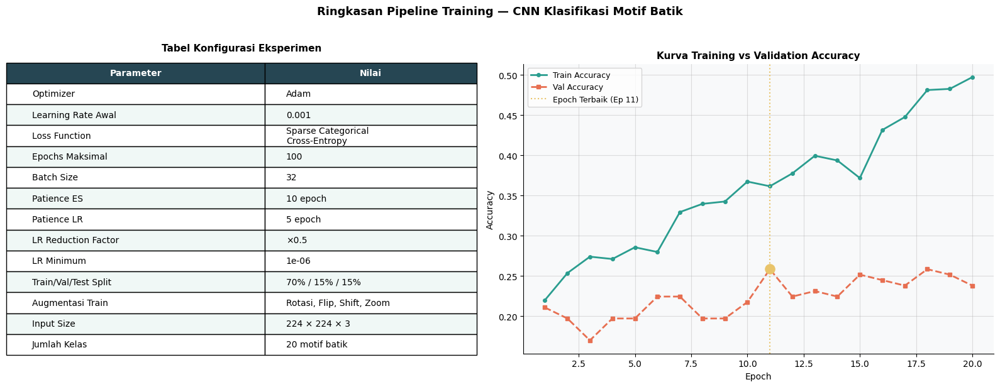

In [ ]:
# ==============================================================================
# BAGIAN 8.7 — Ringkasan Pipeline & Visualisasi Alur Training
# ==============================================================================

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle(
    'Ringkasan Pipeline Training — CNN Klasifikasi Motif Batik',
    fontsize=13, fontweight='bold', y=1.02
)

# Tabel Konfigurasi Eksperimen
ax_tabel = axes[0]
ax_tabel.axis('off')

data_konfigurasi = [
    ['Optimizer',           'Adam'],
    ['Learning Rate Awal',  f'{LEARNING_RATE}'],
    ['Loss Function',       'Sparse Categorical\nCross-Entropy'],
    ['Epochs Maksimal',     f'{EPOCHS_MAX}'],
    ['Batch Size',          f'{BATCH_SIZE}'],
    ['Patience ES',         f'{PATIENCE_ES} epoch'],
    ['Patience LR',         f'{PATIENCE_LR} epoch'],
    ['LR Reduction Factor', f'×{LR_FACTOR}'],
    ['LR Minimum',          f'{LR_MIN}'],
    ['Train/Val/Test Split','70% / 15% / 15%'],
    ['Augmentasi Train',    'Rotasi, Flip, Shift, Zoom'],
    ['Input Size',          '224 × 224 × 3'],
    ['Jumlah Kelas',        f'{NUM_CLASSES} motif batik'],
]

tabel = ax_tabel.table(
    cellText=data_konfigurasi,
    colLabels=['Parameter', 'Nilai'],
    cellLoc='left',
    loc='center',
    colWidths=[0.55, 0.45]
)
tabel.auto_set_font_size(False)
tabel.set_fontsize(10)
tabel.scale(1.0, 2.0)

for col in range(2):
    tabel[0, col].set_facecolor('#264653')
    tabel[0, col].set_text_props(color='white', fontweight='bold')
for row in range(1, len(data_konfigurasi) + 1):
    bg = '#f0f8f6' if row % 2 == 0 else 'white'
    for col in range(2):
        tabel[row, col].set_facecolor(bg)

ax_tabel.set_title('Tabel Konfigurasi Eksperimen',
                   fontsize=11, fontweight='bold', pad=15)

# Kurva Training vs Validation
ax_kurva = axes[1]

epochs_range = df_history['epoch'].tolist()

ax_kurva.plot(epochs_range, df_history['train_accuracy'], 'o-',
              color='#2a9d8f', linewidth=2, markersize=4, label='Train Accuracy')
ax_kurva.plot(epochs_range, df_history['val_accuracy'], 's--',
              color='#e76f51', linewidth=2, markersize=4, label='Val Accuracy')

# Tandai epoch terbaik
best_ep  = df_history['val_accuracy'].idxmax()
best_row = df_history.iloc[best_ep]
ax_kurva.axvline(best_row['epoch'], color='#e9c46a', linewidth=1.5,
                 linestyle=':', label=f'Epoch Terbaik (Ep {int(best_row["epoch"])})')
ax_kurva.scatter(best_row['epoch'], best_row['val_accuracy'],
                 color='#e9c46a', s=120, zorder=5)

ax_kurva.set_title('Kurva Training vs Validation Accuracy', fontsize=11, fontweight='bold')
ax_kurva.set_xlabel('Epoch', fontsize=10)
ax_kurva.set_ylabel('Accuracy', fontsize=10)
ax_kurva.legend(fontsize=9)
ax_kurva.set_facecolor('#f8f9fa')
ax_kurva.grid(True, alpha=0.4)
ax_kurva.spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.show()

---
## Bagian 9: Quantitative Visualization & Training History Analysis

Pada bagian ini dilakukan visualisasi kuantitatif terhadap riwayat pelatihan model CNN final. Riwayat epoch dari proses training digunakan untuk membuat dua grafik garis utama, yaitu perbandingan Training Accuracy vs Validation Accuracy dan Training Loss vs Validation Loss. Kedua grafik ini digunakan untuk menganalisis stabilitas proses pelatihan, titik performa terbaik, serta indikasi overfitting atau underfitting.

### 9.1 Import Library Visualisasi

In [ ]:
# ============================================================
# 9.1 Import Library Visualisasi
# Penanggung jawab: Neyla Shakira
# ============================================================

import os
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style='whitegrid')
os.makedirs('gambar', exist_ok=True)

print('Library visualisasi berhasil diimpor.')

Library visualisasi berhasil diimpor.


### 9.2 Ambil dan Validasi Riwayat Training

In [ ]:
# ============================================================
# 9.2 Ambil dan Validasi Riwayat Training
# ============================================================

# Bagian ini menggunakan df_history dari Bagian 8.5.
# Jika df_history belum ada, kode akan membuatnya dari history_final.

if 'df_history' not in globals():
    print('df_history belum ditemukan. Membuat df_history dari history_final...')

    history_dict = history_final.history

    df_history = pd.DataFrame({
        'epoch': range(1, len(history_dict['loss']) + 1),
        'train_loss': history_dict['loss'],
        'train_accuracy': history_dict['accuracy'],
        'val_loss': history_dict['val_loss'],
        'val_accuracy': history_dict['val_accuracy'],
    })
else:
    print('df_history ditemukan dari Bagian 8.5.')

required_columns = [
    'epoch',
    'train_loss',
    'train_accuracy',
    'val_loss',
    'val_accuracy'
]

missing_columns = [
    col for col in required_columns
    if col not in df_history.columns
]

if missing_columns:
    raise ValueError(f'Kolom berikut belum ada di df_history: {missing_columns}')

print('=' * 70)
print('DATA HISTORY TRAINING UNTUK VISUALISASI')
print('=' * 70)
print(f'Jumlah epoch tercatat : {len(df_history)}')
print(f'Kolom tersedia        : {df_history.columns.tolist()}')
print('=' * 70)

display(df_history)

df_history ditemukan dari Bagian 8.5.
DATA HISTORY TRAINING UNTUK VISUALISASI
Jumlah epoch tercatat : 20
Kolom tersedia        : ['epoch', 'train_loss', 'train_accuracy', 'val_loss', 'val_accuracy', 'gap_accuracy', 'gap_loss']


,epoch,train_loss,train_accuracy,val_loss,val_accuracy,gap_accuracy,gap_loss
0,1,2.523818,0.220117,2.804863,0.210884,0.009232,0.281045
1,2,2.427107,0.253644,2.840431,0.197279,0.056365,0.413324
2,3,2.382618,0.274052,2.815103,0.170068,0.103984,0.432486
3,4,2.340925,0.271137,2.824647,0.197279,0.073858,0.483722
4,5,2.296823,0.285714,2.808460,0.197279,0.088435,0.511636
5,6,2.250821,0.279883,2.875950,0.224490,0.055394,0.625128
6,7,2.209112,0.329446,2.800411,0.224490,0.104956,0.591300
7,8,2.128855,0.339650,2.890075,0.197279,0.142371,0.761220
8,9,2.096775,0.342566,2.841843,0.197279,0.145287,0.745068
9,10,2.070075,0.367347,2.799632,0.217687,0.149660,0.729557


### 9.4 Grafik Training Loss vs Validation Loss

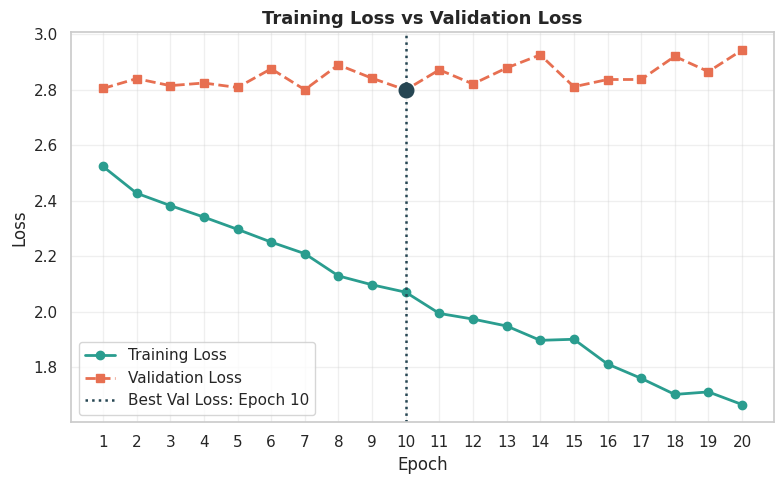

Grafik loss berhasil disimpan:
gambar/neyla_training_validation_loss.png


In [ ]:
# ============================================================
# 9.4 Grafik Training Loss vs Validation Loss
# ============================================================

best_val_loss_idx = df_history['val_loss'].idxmin()
best_val_loss_row = df_history.loc[best_val_loss_idx]

plt.figure(figsize=(8, 5))

plt.plot(
    df_history['epoch'],
    df_history['train_loss'],
    marker='o',
    linewidth=2,
    color='#2a9d8f',
    label='Training Loss'
)

plt.plot(
    df_history['epoch'],
    df_history['val_loss'],
    marker='s',
    linewidth=2,
    linestyle='--',
    color='#e76f51',
    label='Validation Loss'
)

plt.axvline(
    best_val_loss_row['epoch'],
    color='#264653',
    linestyle=':',
    linewidth=1.8,
    label=f'Best Val Loss: Epoch {int(best_val_loss_row["epoch"])}'
)

plt.scatter(
    best_val_loss_row['epoch'],
    best_val_loss_row['val_loss'],
    s=110,
    color='#264653',
    zorder=5
)

plt.title(
    'Training Loss vs Validation Loss',
    fontsize=13,
    fontweight='bold'
)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(df_history['epoch'])
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()

loss_plot_path = 'gambar/neyla_training_validation_loss.png'
plt.savefig(loss_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print('Grafik loss berhasil disimpan:')
print(loss_plot_path)

### 9.3 Grafik Training Accuracy vs Validation Accuracy

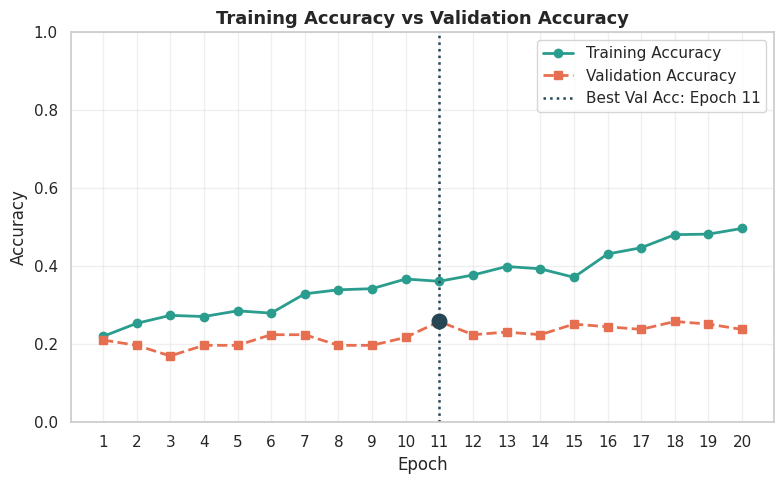

Grafik accuracy berhasil disimpan:
gambar/neyla_training_validation_accuracy.png


In [ ]:
# ============================================================
# 9.3 Grafik Training Accuracy vs Validation Accuracy
# ============================================================

best_val_acc_idx = df_history['val_accuracy'].idxmax()
best_val_acc_row = df_history.loc[best_val_acc_idx]

plt.figure(figsize=(8, 5))

plt.plot(
    df_history['epoch'],
    df_history['train_accuracy'],
    marker='o',
    linewidth=2,
    color='#2a9d8f',
    label='Training Accuracy'
)

plt.plot(
    df_history['epoch'],
    df_history['val_accuracy'],
    marker='s',
    linewidth=2,
    linestyle='--',
    color='#e76f51',
    label='Validation Accuracy'
)

plt.axvline(
    best_val_acc_row['epoch'],
    color='#264653',
    linestyle=':',
    linewidth=1.8,
    label=f'Best Val Acc: Epoch {int(best_val_acc_row["epoch"])}'
)

plt.scatter(
    best_val_acc_row['epoch'],
    best_val_acc_row['val_accuracy'],
    s=110,
    color='#264653',
    zorder=5
)

plt.title(
    'Training Accuracy vs Validation Accuracy',
    fontsize=13,
    fontweight='bold'
)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.xticks(df_history['epoch'])
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()

accuracy_plot_path = 'gambar/neyla_training_validation_accuracy.png'
plt.savefig(accuracy_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print('Grafik accuracy berhasil disimpan:')
print(accuracy_plot_path)

### 9.4 Grafik Training Loss vs Validation Loss

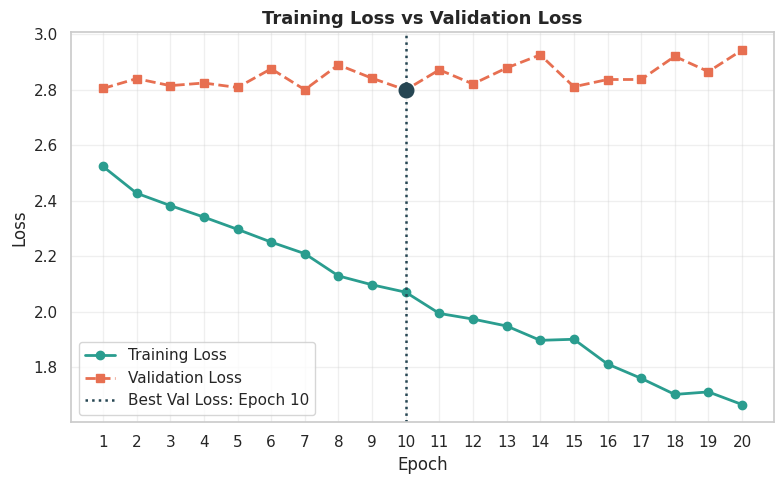

Grafik loss berhasil disimpan:
gambar/neyla_training_validation_loss.png


In [ ]:
# ============================================================
# 9.4 Grafik Training Loss vs Validation Loss
# ============================================================

best_val_loss_idx = df_history['val_loss'].idxmin()
best_val_loss_row = df_history.loc[best_val_loss_idx]

plt.figure(figsize=(8, 5))

plt.plot(
    df_history['epoch'],
    df_history['train_loss'],
    marker='o',
    linewidth=2,
    color='#2a9d8f',
    label='Training Loss'
)

plt.plot(
    df_history['epoch'],
    df_history['val_loss'],
    marker='s',
    linewidth=2,
    linestyle='--',
    color='#e76f51',
    label='Validation Loss'
)

plt.axvline(
    best_val_loss_row['epoch'],
    color='#264653',
    linestyle=':',
    linewidth=1.8,
    label=f'Best Val Loss: Epoch {int(best_val_loss_row["epoch"])}'
)

plt.scatter(
    best_val_loss_row['epoch'],
    best_val_loss_row['val_loss'],
    s=110,
    color='#264653',
    zorder=5
)

plt.title(
    'Training Loss vs Validation Loss',
    fontsize=13,
    fontweight='bold'
)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(df_history['epoch'])
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()

loss_plot_path = 'gambar/neyla_training_validation_loss.png'
plt.savefig(loss_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print('Grafik loss berhasil disimpan:')
print(loss_plot_path)

### 9.5 Analisis Awal Overfitting dan Underfitting

In [ ]:
# ============================================================
# 9.5 Analisis Awal Overfitting / Underfitting
# ============================================================

final_train_acc = float(df_history['train_accuracy'].iloc[-1])
final_val_acc = float(df_history['val_accuracy'].iloc[-1])
final_train_loss = float(df_history['train_loss'].iloc[-1])
final_val_loss = float(df_history['val_loss'].iloc[-1])

best_val_acc = float(df_history['val_accuracy'].max())
best_val_acc_epoch = int(df_history.loc[df_history['val_accuracy'].idxmax(), 'epoch'])

best_val_loss = float(df_history['val_loss'].min())
best_val_loss_epoch = int(df_history.loc[df_history['val_loss'].idxmin(), 'epoch'])

gap_accuracy = final_train_acc - final_val_acc
gap_loss = final_val_loss - final_train_loss

if gap_accuracy > 0.15 and gap_loss > 0:
    diagnosis = 'Indikasi overfitting: performa training jauh lebih tinggi dibanding validation.'
elif final_train_acc < 0.40 and final_val_acc < 0.40:
    diagnosis = 'Indikasi underfitting: akurasi training dan validation masih rendah.'
else:
    diagnosis = 'Model relatif seimbang berdasarkan gap training-validation.'

quantitative_summary = {
    'penanggung_jawab': 'Neyla Shakira',
    'bagian': 'Quantitative Visualization & Training History Analysis',
    'total_epoch': int(len(df_history)),
    'final_train_accuracy': final_train_acc,
    'final_val_accuracy': final_val_acc,
    'final_train_loss': final_train_loss,
    'final_val_loss': final_val_loss,
    'best_val_accuracy': best_val_acc,
    'best_val_accuracy_epoch': best_val_acc_epoch,
    'best_val_loss': best_val_loss,
    'best_val_loss_epoch': best_val_loss_epoch,
    'gap_accuracy_final': float(gap_accuracy),
    'gap_loss_final': float(gap_loss),
    'diagnosis': diagnosis,
    'accuracy_plot': accuracy_plot_path,
    'loss_plot': loss_plot_path
}

print('=' * 70)
print('RINGKASAN KUANTITATIF TRAINING CNN')
print('=' * 70)
print(f'Total epoch              : {quantitative_summary["total_epoch"]}')
print(f'Final Train Accuracy     : {final_train_acc:.4f}')
print(f'Final Val Accuracy       : {final_val_acc:.4f}')
print(f'Final Train Loss         : {final_train_loss:.4f}')
print(f'Final Val Loss           : {final_val_loss:.4f}')
print(f'Best Val Accuracy        : {best_val_acc:.4f} pada epoch {best_val_acc_epoch}')
print(f'Best Val Loss            : {best_val_loss:.4f} pada epoch {best_val_loss_epoch}')
print(f'Gap Accuracy akhir       : {gap_accuracy:.4f}')
print(f'Gap Loss akhir           : {gap_loss:.4f}')
print(f'Diagnosis awal           : {diagnosis}')
print('=' * 70)

RINGKASAN KUANTITATIF TRAINING CNN
Total epoch              : 20
Final Train Accuracy     : 0.4971
Final Val Accuracy       : 0.2381
Final Train Loss         : 1.6649
Final Val Loss           : 2.9435
Best Val Accuracy        : 0.2585 pada epoch 11
Best Val Loss            : 2.7996 pada epoch 10
Gap Accuracy akhir       : 0.2590
Gap Loss akhir           : 1.2786
Diagnosis awal           : Indikasi overfitting: performa training jauh lebih tinggi dibanding validation.


## Bagian 10: Uji Akhir & Evaluasi Performa pada Test Set

### 10.1 Inferensi Pengujian Akhir pada Test Set

In [ ]:
# Mengevaluasi model terlatih (final_model) menggunakan data Test Set
# yang telah diisolasi sejak Bagian 5 (tidak pernah dilihat model saat training).

import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# 10.1a: Evaluasi Loss dan Akurasi Agregat pada Test Set
print('\n[10.1a] Menghitung Test Loss & Test Accuracy secara agregat...\n')

test_loss, test_accuracy = final_model.evaluate(
    X_test, y_test,
    batch_size=32,
    verbose=1
)

print(f'\n  Test Loss     : {test_loss:.4f}')
print(f'  Test Accuracy : {test_accuracy:.4f} ({test_accuracy * 100:.2f}%)')

# 10.1b: Inferensi Prediksi untuk Setiap Sampel Test
print('\n[10.1b] Melakukan inferensi prediksi pada seluruh sampel test...')
print(f'  Jumlah sampel test: {X_test.shape[0]}')

# Prediksi probabilitas untuk semua kelas (output softmax)
y_pred_proba = final_model.predict(X_test, batch_size=32, verbose=1)

# Konversi probabilitas menjadi label prediksi (argmax)
y_pred = np.argmax(y_pred_proba, axis=1)

# Verifikasi shape prediksi
print(f'\n  Shape y_test      : {y_test.shape}')
print(f'  Shape y_pred      : {y_pred.shape}')
print(f'  Shape y_pred_proba: {y_pred_proba.shape}')

# Hitung akurasi manual sebagai cross-check
akurasi_manual = accuracy_score(y_test, y_pred)
print(f'\n  Akurasi (sklearn) : {akurasi_manual:.4f} ({akurasi_manual * 100:.2f}%)')
print(f'  Prediksi benar    : {np.sum(y_test == y_pred)} dari {len(y_test)} sampel')
print(f'  Prediksi salah    : {np.sum(y_test != y_pred)} dari {len(y_test)} sampel')


[10.1a] Menghitung Test Loss & Test Accuracy secara agregat...

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 342ms/step - accuracy: 0.1351 - loss: 2.9029

  Test Loss     : 2.9029
  Test Accuracy : 0.1351 (13.51%)

[10.1b] Melakukan inferensi prediksi pada seluruh sampel test...
  Jumlah sampel test: 148
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step

  Shape y_test      : (148,)
  Shape y_pred      : (148,)
  Shape y_pred_proba: (148, 20)

  Akurasi (sklearn) : 0.1351 (13.51%)
  Prediksi benar    : 20 dari 148 sampel
  Prediksi salah    : 128 dari 148 sampel


### 10.2 Classification Report (Precision, Recall, F1-Score per Kelas)

In [ ]:
# Mencetak tabel lengkap Precision, Recall, dan F1-Score untuk
# tiap-tiap kelas motif batik (20 kelas).

# Daftar nama kelas dari LabelEncoder
nama_kelas = list(le.classes_)

print('=' * 70)
print('  CLASSIFICATION REPORT — 20 KELAS MOTIF BATIK')
print('=' * 70)
print()

# Cetak Classification Report dari sklearn
report_text = classification_report(
    y_test, y_pred,
    target_names=nama_kelas,
    digits=4,               # 4 digit desimal untuk presisi hasil
    zero_division=0         # Tangani kelas tanpa prediksi dengan nilai 0
)
print(report_text)

# Simpan juga dalam bentuk dictionary untuk analisis lanjutan
report_dict = classification_report(
    y_test, y_pred,
    target_names=nama_kelas,
    digits=4,
    output_dict=True,
    zero_division=0
)

# Tampilkan ringkasan metrik rata-rata
print('-' * 70)
print('RINGKASAN METRIK RATA-RATA:')
print(f"  Macro Avg Precision : {report_dict['macro avg']['precision']:.4f}")
print(f"  Macro Avg Recall    : {report_dict['macro avg']['recall']:.4f}")
print(f"  Macro Avg F1-Score  : {report_dict['macro avg']['f1-score']:.4f}")
print(f"  Weighted Avg F1     : {report_dict['weighted avg']['f1-score']:.4f}")
print(f"  Overall Accuracy    : {report_dict['accuracy']:.4f}")
print('-' * 70)

# Identifikasi Kelas Terbaik dan Terburuk
f1_per_kelas = {kelas: report_dict[kelas]['f1-score'] for kelas in nama_kelas}
kelas_terbaik = max(f1_per_kelas, key=f1_per_kelas.get)
kelas_terburuk = min(f1_per_kelas, key=f1_per_kelas.get)

print(f'\n  Kelas F1 Tertinggi : {kelas_terbaik} (F1 = {f1_per_kelas[kelas_terbaik]:.4f})')
print(f'  Kelas F1 Terendah  : {kelas_terburuk} (F1 = {f1_per_kelas[kelas_terburuk]:.4f})')

  CLASSIFICATION REPORT — 20 KELAS MOTIF BATIK

                   precision    recall  f1-score   support

       batik-bali     0.0667    0.1429    0.0909         7
     batik-betawi     0.2222    0.2857    0.2500         7
      batik-celup     0.0000    0.0000    0.0000         8
batik-cendrawasih     0.0625    0.1429    0.0870         7
     batik-ceplok     0.0000    0.0000    0.0000         7
     batik-ciamis     0.2500    0.1250    0.1667         8
    batik-garutan     0.0000    0.0000    0.0000         7
  batik-gentongan     0.3333    0.1250    0.1818         8
     batik-kawung     0.0000    0.0000    0.0000         7
    batik-keraton     0.0526    0.1250    0.0741         8
      batik-lasem     0.2500    0.4286    0.3158         7
batik-megamendung     0.7143    0.7143    0.7143         7
     batik-parang     0.2000    0.2500    0.2222         8
 batik-pekalongan     0.0000    0.0000    0.0000         8
   batik-priangan     0.0000    0.0000    0.0000         8
      b

### 10.3 Visualisasi Confusion Matrix Multiclass (Heatmap Seaborn)

Shape Confusion Matrix: (20, 20)
Total sampel test    : 148
Prediksi benar (diag): 20


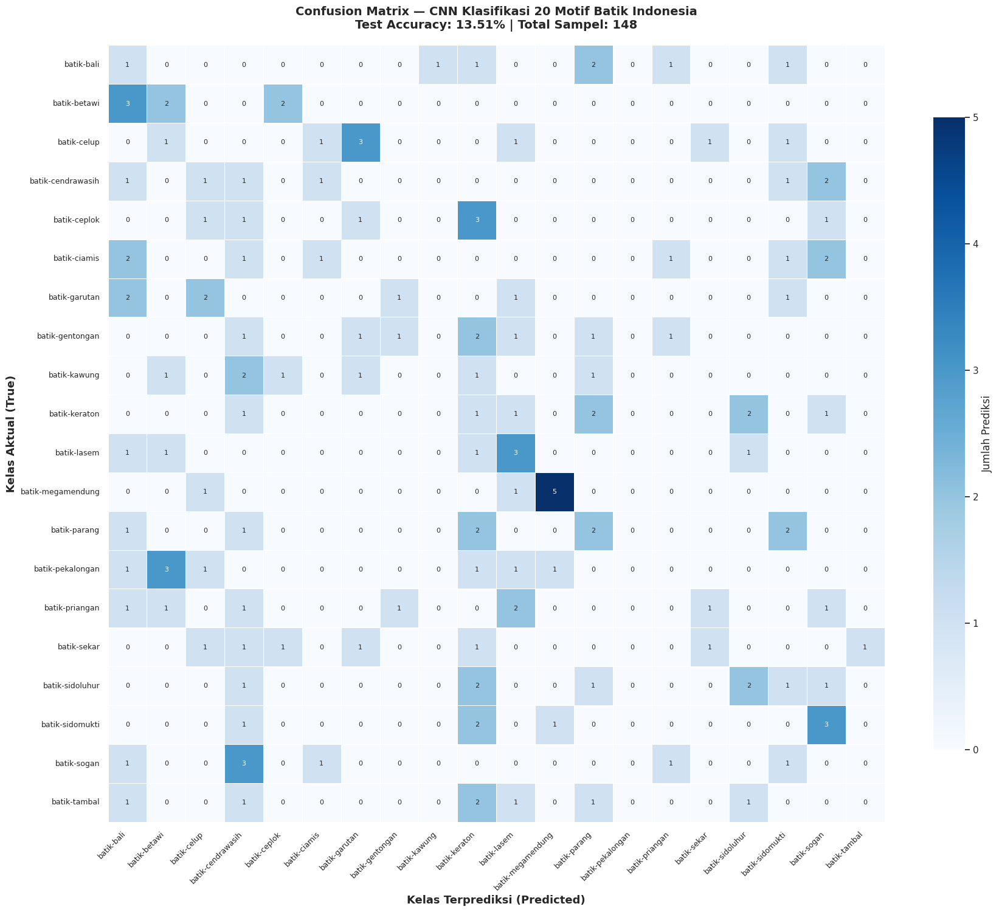

In [ ]:
# Menampilkan pemetaan kelas target (aktual) vs kelas terprediksi
# untuk seluruh 20 kelas motif batik.

# Hitung Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

print(f'Shape Confusion Matrix: {cm.shape}')
print(f'Total sampel test    : {cm.sum()}')
print(f'Prediksi benar (diag): {np.trace(cm)}')

# Plot Confusion Matrix (Angka Absolut)
plt.figure(figsize=(18, 15))

sns.heatmap(
    cm,
    annot=True,                   # Tampilkan angka di setiap sel
    fmt='d',                      # Format integer
    cmap='Blues',                  # Warna gradasi biru
    xticklabels=nama_kelas,       # Label sumbu-X (prediksi)
    yticklabels=nama_kelas,       # Label sumbu-Y (aktual)
    linewidths=0.5,               # Garis pembatas antar sel
    linecolor='white',
    square=True,                  # Sel berbentuk persegi
    cbar_kws={'shrink': 0.8,
              'label': 'Jumlah Prediksi'},
    annot_kws={'size': 8}         # Ukuran font angka
)

plt.xlabel('Kelas Terprediksi (Predicted)', fontsize=13, fontweight='bold')
plt.ylabel('Kelas Aktual (True)', fontsize=13, fontweight='bold')
plt.title(
    'Confusion Matrix — CNN Klasifikasi 20 Motif Batik Indonesia\n'
    f'Test Accuracy: {test_accuracy * 100:.2f}% | Total Sampel: {len(y_test)}',
    fontsize=14, fontweight='bold', pad=20
)

plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(rotation=0, fontsize=9)
plt.tight_layout()

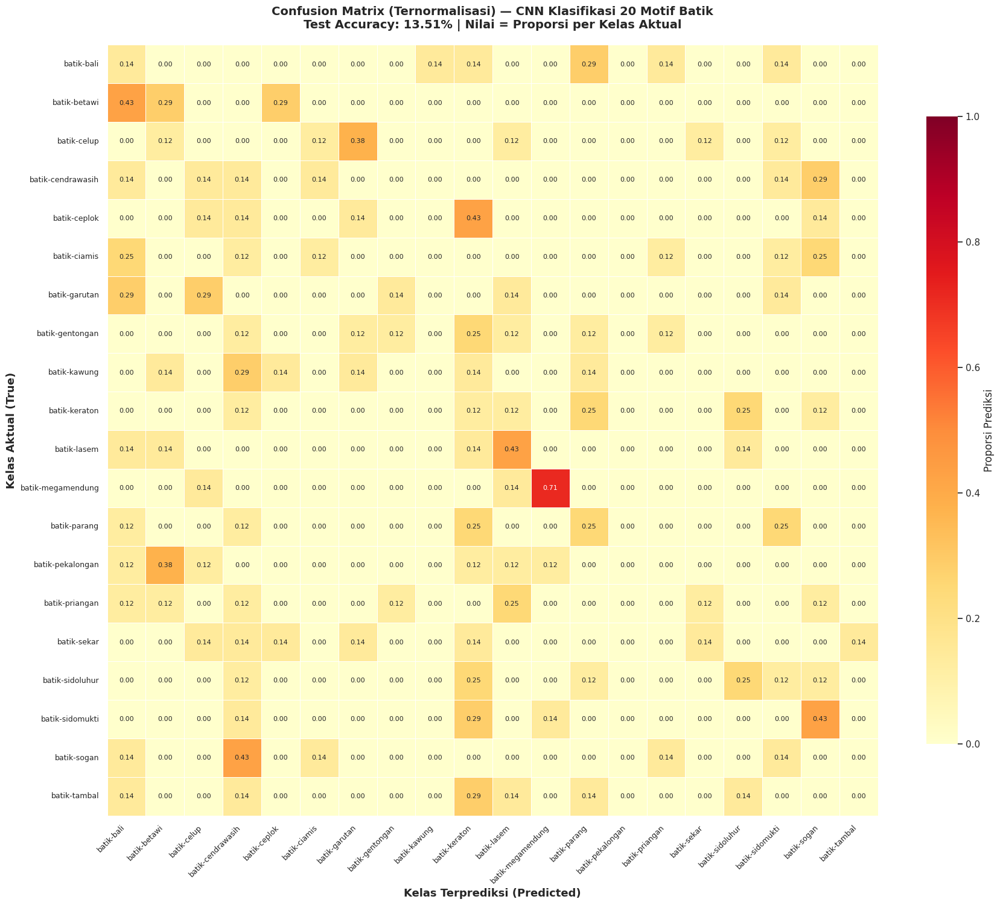

In [ ]:
# Menampilkan proporsi prediksi benar/salah untuk setiap kelas aktual,
# berguna untuk membandingkan performa antar kelas dengan jumlah sampel berbeda.

# Normalisasi per baris (per kelas aktual) agar setiap baris berjumlah 1.0
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(18, 15))

sns.heatmap(
    cm_normalized,
    annot=True,
    fmt='.2f',                    # Format 2 desimal (proporsi)
    cmap='YlOrRd',               # Gradasi kuning-oranye-merah
    xticklabels=nama_kelas,
    yticklabels=nama_kelas,
    linewidths=0.5,
    linecolor='white',
    square=True,
    vmin=0, vmax=1,              # Skala warna 0-1
    cbar_kws={'shrink': 0.8,
              'label': 'Proporsi Prediksi'},
    annot_kws={'size': 8}
)

plt.xlabel('Kelas Terprediksi (Predicted)', fontsize=13, fontweight='bold')
plt.ylabel('Kelas Aktual (True)', fontsize=13, fontweight='bold')
plt.title(
    'Confusion Matrix (Ternormalisasi) — CNN Klasifikasi 20 Motif Batik\n'
    f'Test Accuracy: {test_accuracy * 100:.2f}% | Nilai = Proporsi per Kelas Aktual',
    fontsize=14, fontweight='bold', pad=20
)

plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(rotation=0, fontsize=9)
plt.tight_layout()